In [1]:
import glob
import io
import itertools
import math
import os
import pickle
import subprocess
import warnings
from pathlib import Path
from statistics import median

import gzip
import bioreactor
import boto3
import matplotlib
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import norm
from supervenn import supervenn
from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_notebook

%config InlineBackend.figure_format = 'png'
plt.rcParams["pdf.fonttype"] = "truetype"
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["figure.dpi"] = 200

sns.set_style("ticks")
sns.axes_style("white")

# Конфиг для RND
# config_rnd = Config(api_key="IcgvVkwBRUOOygkF.eqP/dJz5G/h+OPzy0JJqSglu1=oHYWdNY")

# setup(config_rnd)

import csv

import pyreadr
import rpy2.robjects as ro
from biomart import BiomartServer
from neuroCombat import neuroCombat
from rpy2.robjects import numpy2ri, pandas2ri
from rpy2.robjects.conversion import localconverter
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import (
    BoolVector,
    DataFrame,
    FloatVector,
    IntVector,
    ListVector,
    Matrix,
    StrVector,
)
from scipy.interpolate import interp1d
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ── Font size constants (change FONT_BASE to scale all text globally) ──────
FONT_BASE   = 14
FONT_TITLE  = FONT_BASE
FONT_LABEL  = FONT_BASE
FONT_TICK   = FONT_BASE - 2
FONT_LEGEND = FONT_BASE - 2
FONT_ANNOT  = FONT_BASE - 2
FONT_SMALL  = FONT_BASE - 4
FONT_TINY   = FONT_BASE - 4

plt.rcParams.update({
    "svg.fonttype":     "none",
    "figure.dpi":       150,
    "font.size":        FONT_BASE,
    "axes.titlesize":   FONT_TITLE,
    "axes.labelsize":   FONT_LABEL,
    "xtick.labelsize":  FONT_TICK,
    "ytick.labelsize":  FONT_TICK,
    "legend.fontsize":  FONT_LEGEND,
    "figure.titlesize": FONT_TITLE,
})


In [22]:
def log_transform_by_cohort(
    exp_df: pd.DataFrame,
    ann_df: pd.DataFrame,
    batch_col: str = "COHORT_LABEL",
    threshold: float = 30,
) -> pd.DataFrame:
    """
    Apply log2(x+1) transform per cohort only when max value exceeds threshold.

    Parameters
    ----------
    exp_df
        Expression matrix (samples × genes).
    ann_df
        Annotation with batch_col column.
    batch_col
        Column used to group samples (COHORT_LABEL, not RNA_BATCH).
    threshold
        Cohorts with max > threshold are log2(x+1) transformed.

    Returns
    -------
    Log2-transformed expression matrix.
    """
    batches = ann_df[batch_col].value_counts().index
    df_list = []
    for batch in batches:
        samples = ann_df.index[ann_df[batch_col] == batch]
        exp_local = exp_df.reindex(samples)
        if exp_local.max().max() > threshold:
            exp_local = np.log2(exp_local + 1)
        df_list.append(exp_local)
    return pd.concat(df_list, axis=0)

def plot_batch_distributions(exp_df, ann_df, batch_col='RNA_BATCH',
                              ncols=8, figsize=(28, 20), title_prefix=""):
    batches = ann_df[batch_col].value_counts().index
    nrows   = int(np.ceil(len(batches) / ncols))
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, squeeze=False)
    for ax, batch in zip(axs.flatten(), batches):
        samples = ann_df.index[ann_df[batch_col] == batch]
        vals    = exp_df.reindex(samples).values#.ravel()
        vals    = vals[~np.isnan(vals)]
        ax.hist(vals, bins=40, density=True, alpha=0.7, color="steelblue")
        ax.set_title(batch, fontsize=10)
        #ax.set_xlim(-2, 18)
    for ax in axs.flatten()[len(batches):]:
        ax.set_visible(False)
    fig.suptitle(f"{title_prefix} Expression distributions per {batch_col}", fontsize=10)
    plt.tight_layout()
    return fig


In [12]:
comb_ann

,Unnamed: 0.1,PLATFORM_RNA,OS,RNASEQ_PAIRED/SINGLE,DNA_REFERENCE_GENOME,PUBLIC_PATIENT_ID,NEO_CHEMO_THERAPY,NEO_THERAPY,RNASEQ_CALC_BY_BG,PFS,...,TRANSFORMED,PFS (MONTHS),PD/DEAD,POD24,LAST FOLLOW-UP/DEATH DATE,OS (MONTHS),DEAD,COD,Notes,Diagnosis_with_coo
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
GSM4644254-PUB_DLBCL_CARTFARAMAND,0.0,RNASeq,NaN,NaN,NaN,GSM4644254,NaN,CAR-T_CD19,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC
GSM4644255-PUB_DLBCL_CARTFARAMAND,1.0,RNASeq,NaN,NaN,NaN,GSM4644255,NaN,CAR-T_CD19,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_GCB
GSM4644256-PUB_DLBCL_CARTFARAMAND,2.0,RNASeq,NaN,NaN,NaN,GSM4644256,NaN,CAR-T_CD19,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC
GSM4644257-PUB_DLBCL_CARTFARAMAND,3.0,RNASeq,NaN,NaN,NaN,GSM4644257,NaN,CAR-T_CD19,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_GCB
GSM4644258-PUB_DLBCL_CARTFARAMAND,4.0,RNASeq,NaN,NaN,NaN,GSM4644258,NaN,CAR-T_CD19,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RS005287,NaN,RNASeq,NaN,NaN,NaN,FLSP39,NaN,NaN,NaN,NaN,...,0.0,4.0,Dead,Yes,7/21/2010,13.0,1.0,Unknown,NaN,Follicular_Lymphoma_
RS005288,NaN,RNASeq,NaN,NaN,NaN,FLSP40,NaN,NaN,NaN,NaN,...,0.0,NaN,Dead,No,1/31/2023,238.0,1.0,Unknown,NaN,Follicular_Lymphoma_
RS005289,NaN,RNASeq,NaN,NaN,NaN,FLSP41,NaN,NaN,NaN,NaN,...,0.0,11.0,PD/Dead,Yes,12/20/2008,46.0,1.0,progressive disease,NaN,Follicular_Lymphoma_


## Initial expressions and annotation download

In [3]:
comb_exp = pd.read_csv(
    "/uftp/projects/FL_lymphoma_subtypes/comb_exp.tsv", sep="\t"
).set_index("Unnamed: 0")
comb_ann = pd.read_csv(
    "/home/jovyan/Projects/Follicular_lymphoma_disser/comb_ann_unified.csv"
).set_index("Unnamed: 0")

comb_ann["Diagnosis_with_coo"] = (
    comb_ann.Diagnosis_cell_type_general + "_" + comb_ann["coo_bg"].fillna("")
)
comb_ann["Diagnosis_unified_with_coo"] = (
    comb_ann.Diagnosis_cell_type_unified + "_" + comb_ann["coo_bg"].fillna("")
)
comb_ann.loc[comb_ann.index.isin(["PUB_Suntsova_GSE120795"]), "RNA_BATCH"] = (
    "RNASeq_FF_Unknown"
)

common_samples = comb_exp.index.intersection(comb_ann.index)  # [:7000]
comb_exp = comb_exp.loc[common_samples]  # .dropna(axis=1)
comb_exp = comb_exp.loc[~comb_exp.index.duplicated(keep="first"), :]
# Handle NaNs if necessary
comb_ann = comb_ann.loc[~comb_ann.index.duplicated(keep="first"), :]


comb_ann

/tmp/ipykernel_155/2820774796.py:4: DtypeWarning: Columns (5,6,8,9,12,14,15,16,17,18,21,22,23,24,25,27,28,29,30,33,35,36,37,38,41,42,43,45,47,48,50,51,52,53,54,55,56,58,59,60,61,62,63,64,65,68,69,70,71,74,75,76,77,79,82,84,86,88,90,91,92,93,94,97,98,100,101,103,104,106,111,113,114,117,118,119,121,122,127,129,130,131,132,133,134,141,142,144,145,146,147,149,150,151,152,153,154,155,156,157,158,161,162,163,164,165,166,168,170,171,173,174,176,178,179,180,182,183,184,185,186,193,194,196,199,201,202,206,207,211,213,214,218,221,222,223,226,227,231,232,235,236,237,238,239,240,241,242,243,244,246,247,249,251,253,254,257,258,259,261,262,263,264,266,267,268,269,271,272,273,274,275,276,277,278,279,280,281,282,283,285,287,288,289,291,294,295,299,300,301,304,305,306,307,308,309,310,311,315,317,319,322,323,325,327,330,332,334,336,338,342,344,346,348,349,355,356,357,358,360,361,362,363,368,370,371,372,375,377,383,384,388,389,393,394,395,396,397,398,399,400,401,402,403,404,405,406,408,409,410,411,412,41

,Diagnosis_cell_type_unified,Unnamed: 0.1,PLATFORM_RNA,OS,RNASEQ_PAIRED/SINGLE,DNA_REFERENCE_GENOME,PUBLIC_PATIENT_ID,NEO_CHEMO_THERAPY,NEO_THERAPY,RNASEQ_CALC_BY_BG,...,PFS (MONTHS),PD/DEAD,POD24,LAST FOLLOW-UP/DEATH DATE,OS (MONTHS),DEAD,COD,Notes,Diagnosis_with_coo,Diagnosis_unified_with_coo
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
GSM4644254-PUB_DLBCL_CARTFARAMAND,Diffuse_Large_B_Cell_Lymphoma,0.0,RNASeq,NaN,NaN,NaN,GSM4644254,NaN,CAR-T_CD19,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC,Diffuse_Large_B_Cell_Lymphoma_ABC
GSM4644255-PUB_DLBCL_CARTFARAMAND,Diffuse_Large_B_Cell_Lymphoma,1.0,RNASeq,NaN,NaN,NaN,GSM4644255,NaN,CAR-T_CD19,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_GCB,Diffuse_Large_B_Cell_Lymphoma_GCB
GSM4644256-PUB_DLBCL_CARTFARAMAND,Diffuse_Large_B_Cell_Lymphoma,2.0,RNASeq,NaN,NaN,NaN,GSM4644256,NaN,CAR-T_CD19,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC,Diffuse_Large_B_Cell_Lymphoma_ABC
GSM4644257-PUB_DLBCL_CARTFARAMAND,Diffuse_Large_B_Cell_Lymphoma,3.0,RNASeq,NaN,NaN,NaN,GSM4644257,NaN,CAR-T_CD19,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_GCB,Diffuse_Large_B_Cell_Lymphoma_GCB
GSM4644258-PUB_DLBCL_CARTFARAMAND,Diffuse_Large_B_Cell_Lymphoma,4.0,RNASeq,NaN,NaN,NaN,GSM4644258,NaN,CAR-T_CD19,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Diffuse_Large_B_Cell_Lymphoma_ABC,Diffuse_Large_B_Cell_Lymphoma_ABC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RS005287,Follicular_Lymphoma,NaN,RNASeq,NaN,NaN,NaN,FLSP39,NaN,NaN,NaN,...,4.0,Dead,Yes,7/21/2010,13.0,1.0,Unknown,NaN,Follicular_Lymphoma_,Follicular_Lymphoma_
RS005288,Follicular_Lymphoma,NaN,RNASeq,NaN,NaN,NaN,FLSP40,NaN,NaN,NaN,...,NaN,Dead,No,1/31/2023,238.0,1.0,Unknown,NaN,Follicular_Lymphoma_,Follicular_Lymphoma_
RS005289,Follicular_Lymphoma,NaN,RNASeq,NaN,NaN,NaN,FLSP41,NaN,NaN,NaN,...,11.0,PD/Dead,Yes,12/20/2008,46.0,1.0,progressive disease,NaN,Follicular_Lymphoma_,Follicular_Lymphoma_


#### Imputed expressions download

In [3]:
comb_exp = pd.read_csv(
    "/home/jovyan/Projects/Follicular_lymphoma_disser/shambhala_adoption/Shambhala2/large_tables/S0_no_removal__knn__exp.tsv", sep="\t"
).set_index("Unnamed: 0")
comb_ann = pd.read_csv(
    "/home/jovyan/Projects/Follicular_lymphoma_disser/comb_ann_unified.csv"
).set_index("Unnamed: 0")

comb_ann["Diagnosis_with_coo"] = (
    comb_ann.Diagnosis_cell_type_general + "_" + comb_ann["coo_bg"].fillna("")
)
comb_ann["Diagnosis_unified_with_coo"] = (
    comb_ann.Diagnosis_cell_type_unified + "_" + comb_ann["coo_bg"].fillna("")
)
comb_ann.loc[comb_ann.index.isin(["PUB_Suntsova_GSE120795"]), "RNA_BATCH"] = (
    "RNASeq_FF_Unknown"
)

common_samples = comb_exp.index.intersection(comb_ann.index)  # [:7000]
comb_exp = comb_exp.loc[common_samples]  # .dropna(axis=1)
comb_exp = comb_exp.loc[~comb_exp.index.duplicated(keep="first"), :]
# Handle NaNs if necessary
comb_ann = comb_ann.loc[~comb_ann.index.duplicated(keep="first"), :]


/tmp/ipykernel_150/4147299154.py:4: DtypeWarning: Columns (5,6,8,9,12,14,15,16,17,18,21,22,23,24,25,27,28,29,30,33,35,36,37,38,41,42,43,45,47,48,50,51,52,53,54,55,56,58,59,60,61,62,63,64,65,68,69,70,71,74,75,76,77,79,82,84,86,88,90,91,92,93,94,97,98,100,101,103,104,106,111,113,114,117,118,119,121,122,127,129,130,131,132,133,134,141,142,144,145,146,147,149,150,151,152,153,154,155,156,157,158,161,162,163,164,165,166,168,170,171,173,174,176,178,179,180,182,183,184,185,186,193,194,196,199,201,202,206,207,211,213,214,218,221,222,223,226,227,231,232,235,236,237,238,239,240,241,242,243,244,246,247,249,251,253,254,257,258,259,261,262,263,264,266,267,268,269,271,272,273,274,275,276,277,278,279,280,281,282,283,285,287,288,289,291,294,295,299,300,301,304,305,306,307,308,309,310,311,315,317,319,322,323,325,327,330,332,334,336,338,342,344,346,348,349,355,356,357,358,360,361,362,363,368,370,371,372,375,377,383,384,388,389,393,394,395,396,397,398,399,400,401,402,403,404,405,406,408,409,410,411,412,41

In [4]:
comb_exp_log = log_transform_by_cohort(comb_exp, comb_ann)
comb_exp_log

,A1CF,A2M,A4GALT,A4GNT,AAAS,AACS,AADAC,AAGAB,AAK1,AAMP,...,ZSWIM1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYX,ZZEF1,ZZZ3
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
GSM3302930-PUB_DLBCL_GSE117556,7.984000,13.909000,10.199000,7.909000,12.586000,12.052000,8.140000,14.901000,11.108000,10.822000,...,13.604000,12.761000,14.176000,12.757000,12.306000,12.521000,13.833000,12.217000,13.231000,12.984000
GSM3302931-PUB_DLBCL_GSE117556,8.329000,14.021000,11.358000,8.090000,11.535000,11.345000,7.490000,14.226000,11.588000,11.283000,...,14.169000,13.046000,13.173000,12.327000,12.459000,11.729000,13.348000,12.327000,13.078000,12.773000
GSM3302932-PUB_DLBCL_GSE117556,7.715000,14.306000,10.182000,8.015000,11.218000,12.357000,7.701000,14.042000,11.722000,11.481000,...,13.194000,12.524000,13.319000,12.383000,12.279000,12.469000,13.597000,11.463000,13.393000,12.909000
GSM3302933-PUB_DLBCL_GSE117556,7.655000,14.229000,11.186000,8.312000,11.326000,10.586000,7.869000,14.807000,13.014000,11.040000,...,14.026000,12.865000,12.700000,12.764000,13.190000,14.280000,13.092000,13.433000,12.386000,12.189000
GSM3302934-PUB_DLBCL_GSE117556,7.468000,14.939000,12.885000,7.944000,11.373000,11.223000,7.622000,14.584000,11.672000,11.724000,...,13.633000,13.237000,12.792000,13.410000,11.862000,11.425000,12.381000,12.249000,12.661000,12.309000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,0.078633,0.000000,0.127949,0.000000,4.584959,3.028887,0.000000,4.440874,1.185971,6.007177,...,3.960816,3.651375,3.697128,1.141521,3.566046,3.990533,3.616934,6.114986,5.151630,4.363616
GSM1517171,3.039433,3.859670,4.122257,0.936788,4.413897,5.565601,1.769345,5.020569,4.427465,5.715184,...,4.833403,4.537564,4.732630,6.553904,4.630171,4.638877,6.414587,5.691482,6.126837,7.373147
GSM1517172,2.833564,4.024887,4.122257,0.936788,4.413897,4.957952,2.131468,5.342829,4.477521,5.715184,...,4.833403,4.537564,4.732630,5.585995,4.630171,4.638877,6.022654,6.259402,6.126837,7.373147


In [9]:
comb_exp_log.dropna(axis=0)[:1000].to_csv(
    "./Shambhala2/comb_exp_log_strict_subset_first_1000.csv",
    index=True,  # Keep the index (the gene names)
    #index_label="SYMBOL",  # Name the index column "SYMBOL" in the CSV header
    #quoting=csv.QUOTE_ALL,  # ⬅️ Force " " around everything
)

In [8]:
comb_exp_log.dropna(axis=0)[:1000]

,A1CF,A2M,A4GALT,A4GNT,AAAS,AACS,AADAC,AAGAB,AAK1,AAMP,...,ZSWIM1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYX,ZZEF1,ZZZ3
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
GSM3302930-PUB_DLBCL_GSE117556,7.984000,13.909000,10.199000,7.909000,12.586000,12.052000,8.140000,14.901000,11.108000,10.822000,...,13.604000,12.761000,14.176000,12.757000,12.306000,12.521000,13.833000,12.217000,13.231000,12.984000
GSM3302931-PUB_DLBCL_GSE117556,8.329000,14.021000,11.358000,8.090000,11.535000,11.345000,7.490000,14.226000,11.588000,11.283000,...,14.169000,13.046000,13.173000,12.327000,12.459000,11.729000,13.348000,12.327000,13.078000,12.773000
GSM3302932-PUB_DLBCL_GSE117556,7.715000,14.306000,10.182000,8.015000,11.218000,12.357000,7.701000,14.042000,11.722000,11.481000,...,13.194000,12.524000,13.319000,12.383000,12.279000,12.469000,13.597000,11.463000,13.393000,12.909000
GSM3302933-PUB_DLBCL_GSE117556,7.655000,14.229000,11.186000,8.312000,11.326000,10.586000,7.869000,14.807000,13.014000,11.040000,...,14.026000,12.865000,12.700000,12.764000,13.190000,14.280000,13.092000,13.433000,12.386000,12.189000
GSM3302934-PUB_DLBCL_GSE117556,7.468000,14.939000,12.885000,7.944000,11.373000,11.223000,7.622000,14.584000,11.672000,11.724000,...,13.633000,13.237000,12.792000,13.410000,11.862000,11.425000,12.381000,12.249000,12.661000,12.309000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MPI-734,-0.159418,0.083074,0.048127,-0.566115,0.053822,-0.454868,0.640017,-0.132789,0.034196,-0.120203,...,4.284407,-0.129806,-0.117193,0.371609,-0.262562,-0.588497,-0.189196,0.050417,-0.242133,-0.150362
MPI-042,-0.412911,0.098897,-0.030684,-0.220525,-0.081783,-0.221475,-0.024180,0.179948,-0.016830,0.067991,...,4.284407,0.293369,0.471547,0.218467,-0.069088,-0.125157,0.124448,-0.043581,-0.056761,-0.027986
MPI-062,0.048039,0.042161,-0.361550,-0.007529,-0.080229,-0.024945,-0.361244,0.157732,-0.096161,0.115039,...,4.284407,-0.272265,0.300630,0.179496,0.172745,0.020063,-0.186440,0.088694,-0.251990,0.047069


In [6]:
comb_exp_log.dropna(axis=1)[:4000].T.to_csv(
    "./Shambhala2/comb_exp_log_dedup_strict_subset_first_4000.csv",
    index=True,  # Keep the index (the gene names)
    index_label="SYMBOL",  # Name the index column "SYMBOL" in the CSV header
    quoting=csv.QUOTE_ALL,  # ⬅️ Force " " around everything
)

In [7]:
comb_exp_log.dropna(axis=1)[4000:].T.to_csv(
    "./Shambhala2/comb_exp_log_dedup_strict_subset_4000_and_beyond.csv",
    index=True,  # Keep the index (the gene names)
    index_label="SYMBOL",  # Name the index column "SYMBOL" in the CSV header
    quoting=csv.QUOTE_ALL,  # ⬅️ Force " " around everything
)

In [31]:
comb_exp_log.dropna(axis=1).T.to_csv(
    "./Shambhala2/comb_exp_log_dedup_strict.csv",
    index=True,  # Keep the index (the gene names)
    index_label="SYMBOL",  # Name the index column "SYMBOL" in the CSV header
    quoting=csv.QUOTE_ALL,  # ⬅️ Force " " around everything
)

In [32]:
comb_exp_log.T.to_csv(
    "./Shambhala2/comb_exp_log_dedup.csv",
    index=True,  # Keep the index (the gene names)
    index_label="SYMBOL",  # Name the index column "SYMBOL" in the CSV header
    quoting=csv.QUOTE_ALL,  # ⬅️ Force " " around everything
)

/tmp/ipykernel_126/781404738.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(comb_exp.T['GSM4644254-PUB_DLBCL_CARTFARAMAND'])


<Axes: xlabel='GSM4644254-PUB_DLBCL_CARTFARAMAND', ylabel='Density'>

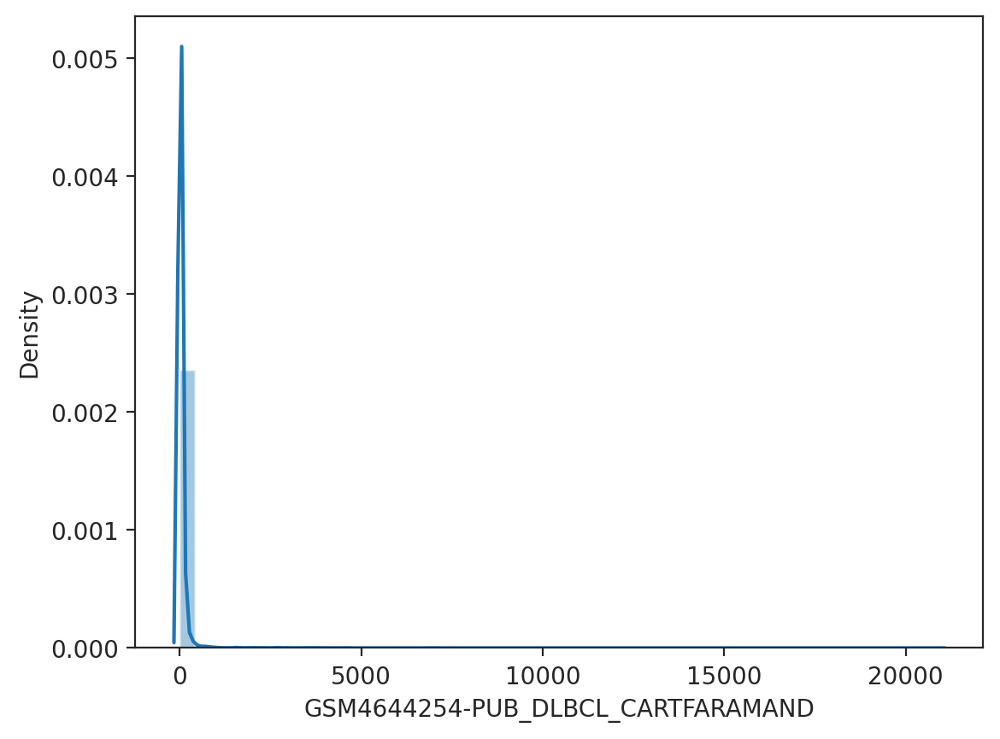

In [8]:
sns.distplot(comb_exp.T["GSM4644254-PUB_DLBCL_CARTFARAMAND"])

## P and Q datasets

In [6]:
q_dataset = pd.read_csv("./Shambhala2/Q0.csv") # GTEx, NGS
q_dataset.T[0].value_counts()

/tmp/ipykernel_132/205113171.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100) have mixed types. Specify dtype option on import or set low_memory=False.
  q_dataset = pd.read_csv("./Shambhala2/Q0.csv") # GTEx, NGS


0
Brain             33
Blood             15
Muscle            12
Heart             10
Skin               7
Blood Vessel       6
Lung               6
Thyroid            5
Adipose Tissue     4
Nerve              2
Sample_type        1
Name: count, dtype: int64

In [7]:
p_dataset = pd.read_csv("./Shambhala2/P0.csv") # affymetrix, check
p_dataset.T[0].value_counts()

0
Human skeletal muscle myoblasts (HSMMs)                         9
skin, no treatment                                              6
human adipose tissue                                            4
Brain (Inferior Olivary Nucleus)_control subject_#5             1
Brain (Inferior Olivary Nucleus)_control subject_#4             1
Brain (Dorsal Motor Nucleus of the Vagus)_control subject_#4    1
Brain (Inferior Olivary Nucleus)_control subject_#3             1
Brain (Dorsal Motor Nucleus of the Vagus)_control subject_#3    1
Brain (Inferior Olivary Nucleus)_control subject_#2             1
Brain (Dorsal Motor Nucleus of the Vagus)_control subject_#2    1
Brain (Inferior Olivary Nucleus)_control subject_#1             1
whole blood, flare, FMF, Patient8                               1
Sample_type                                                     1
whole blood, control, Healthy Control5                          1
whole blood, control, Healthy Control4                          1
whole bl

### Calibration datasets transformation for the containerized shambhala

In [18]:
q_dataset.columns

Index(['A1BG', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AAED1', 'AAGAB', 'AAK1',
       'AAMDC', 'AAMP',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11B', 'ZYX',
       'ZZEF1', 'ZZZ3'],
      dtype='object', name='SYMBOL', length=11887)

In [21]:
q_dataset = pd.read_csv("./Shambhala2/Q0.csv")
q_dataset = q_dataset.set_index('SYMBOL')
q_dataset = q_dataset[q_dataset.index != 'Sample_type'].T
q_dataset.columns.name = ''
q_dataset.to_csv('./Calibration_datasets/Q0_standard.csv')

/tmp/ipykernel_132/857474353.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100) have mixed types. Specify dtype option on import or set low_memory=False.
  q_dataset = pd.read_csv("./Shambhala2/Q0.csv")


In [36]:
q_dataset

,A1BG,A2M,A4GALT,AAAS,AACS,AAED1,AAGAB,AAK1,AAMDC,AAMP,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
GTEX.14JIY.1426.SM.6EU29,303.169709328873,49923.9615606554,1604.30454662312,2308.92840970169,812.736751941494,765.106598106783,1014.59788009813,511.835145176178,507.298940049063,3861.06659736298,...,555.685128,239.662838,74.847385,262.343863,539.052376,739.401436,1247.45641,10719.80875,2873.685948,1557.430427
GTEX.YF7O.2426.SM.5IFJL,170.541944808918,37411.1745646861,1916.96957046666,1907.20571866462,2286.69409203713,885.906820171517,885.906820171517,699.74271247934,504.465676438594,5011.45966825901,...,655.479918,245.398142,63.790498,324.810803,565.652481,1536.17935,1447.002837,10394.596628,4400.893469,1336.34585
GTEX.1CB4G.2126.SM.7IGQ8,147.55308471074,65154.182890392,2148.28525809053,2644.26815174693,994.157169758997,570.489896827169,872.170213587247,672.754410983128,485.025981425404,3691.74896103011,...,517.166257,210.372715,52.593179,476.260452,510.59211,965.669198,1433.894581,10668.380209,3227.175882,1357.196195
GTEX.14PJ4.2226.SM.6LLIS,183.758274218164,69672.2664944274,2478.83575428088,1297.7136055131,899.148245226118,1326.86146969943,1091.77760854447,425.178627587544,372.585742207863,4194.75784594566,...,653.292347,300.98338,74.136959,236.984809,544.304681,1353.474737,1906.650507,11362.597839,5000.759656,1653.824468
GTEX.1445S.1126.SM.5QGOW,436.436285281311,81203.3877167495,2764.67955465776,2316.87318579197,958.585508353339,669.960309670308,1336.42213208385,636.72468073105,230.900158946425,3281.58104684464,...,533.519307,223.028563,27.113276,157.431927,304.368391,802.902825,1324.177427,11769.785754,3486.242551,1592.686324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTEX.13G51.1226.SM.5K7Z3,74.1657639229765,22783.1865390859,2223.18579084778,2514.48746601513,952.538606528831,478.949993526692,1307.28328457006,1422.55296584794,225.177982031206,3207.89268052393,...,437.846076,229.645799,206.41315,211.774531,530.776672,1061.553344,1775.510517,5999.384807,4234.597051,2020.346894
GTEX.145MH.0426.SM.5LU8T,218.989679693205,35326.2417254628,1499.49942668431,2728.84336066299,1081.30418166271,676.070942604256,1173.40264508509,581.243635821217,313.134775636078,4364.78495538046,...,506.200443,238.091583,107.107102,198.523354,425.699564,1169.30938,1716.442474,3835.389343,3929.534439,1842.651479
GTEX.1B8KZ.0426.SM.731DP,93.1587581716601,31144.1373412631,851.737217569463,1833.23127687803,1185.27884280907,534.831084860513,1965.48344249672,1295.90486813791,235.392219308748,3760.45308655424,...,677.064546,201.28946,245.373515,348.513569,517.363818,1411.521541,2170.931775,3011.855923,3478.481488,2035.352511
GTEX.11DXZ.0926.SM.5N9CG,158.788703212948,23654.1210460958,1263.37225517486,1963.27585962805,1207.8732909451,482.53266121993,1450.68125945033,1087.62553511393,215.058486390352,4648.80907319073,...,459.408093,214.287667,205.808659,372.305552,517.990333,1278.017815,1816.82026,3255.939235,5112.071261,1722.780348


In [44]:
p_dataset

,A1CF,A2M,A4GALT,A4GNT,AAAS,AACS,AADAC,AAGAB,AAK1,AAMDC,...,ZSWIM8,ZSWIM8-AS1,ZW10,ZWILCH,ZXDA,ZXDB,ZXDC,ZYX,ZZEF1,ZZZ3
GSM298370,4.44205594629702,4552.83822340974,4.44205594629702,4.44205594629702,14.9731375967155,4028.52745071954,5.28011699814127,72.427939491283,4.44205594629702,395.654945944458,...,5.75543821196071,4.44205594629702,106.933574661118,15.0015973763786,4.44205594629702,4.44205594629702,118.162583563336,72.7108927994406,34.3126627086333,373.235603551181
GSM298374,4.44205594629702,5255.96093340127,4.44205594629702,4.44205594629702,9.83913402026948,1404.13824370903,122.179035527654,66.8407710653492,4.44205594629702,433.37530549308,...,5.58764733162924,4.44205594629702,277.857792695487,13.1820838918482,4.44205594629702,4.44205594629702,123.342308401077,53.0727141791563,34.3126627086333,285.834076484778
GSM298376,4.50906856063944,4028.7458303827,4.44205594629702,4.44205594629702,9.83913402026948,1876.59683130077,136.502555298651,70.7044725845777,4.44205594629702,398.522683897581,...,5.58764733162924,4.44205594629702,224.46451980492,5.93375053558915,4.44205594629702,4.44205594629702,27.9092501038802,20.5007459189425,34.3126627086333,321.064438990675
GSM298378,4.44205594629702,4696.5917727421,4.44205594629702,4.44205594629702,9.83913402026948,1493.70688125563,84.043207111551,62.2636075237909,4.44205594629702,229.069752248002,...,5.75543821196071,4.44205594629702,231.480371439028,26.4171417319459,4.44205594629702,4.44205594629702,75.4071569499278,36.3746708735612,34.3126627086333,370.934305231959
GSM298380,4.54670461098042,6011.76139606316,4.44205594629702,4.44205594629702,13.6429176214432,2262.20118963935,89.8187746804218,65.4504433066038,4.44205594629702,290.923333539624,...,5.75543821196071,4.44205594629702,277.572060362642,6.82366964661534,4.44205594629702,4.45257846680185,96.8055575932871,50.1166433731983,34.3126627086333,371.837322754464
GSM298382,4.48197046451583,3295.58188960788,4.44205594629702,4.44205594629702,15.0717446000571,1061.18618232684,394.579093902345,71.4165031959895,4.44205594629702,156.64521760861,...,5.75543821196071,4.44205594629702,401.420868518692,164.697857528167,4.44205594629702,4.44205594629702,79.4222097981946,51.8798066211706,30.5945592131545,444.211414320261
GSM358669,4.44205594629702,175.672640024466,4.44205594629702,4.44205594629702,56.0567448066251,354.644784055773,4.44205594629702,72.5059980332479,4.44205594629702,424.844103517844,...,5.75543821196071,4.44205594629702,170.769900348455,34.6755376290119,4.44205594629702,4.44205594629702,128.436062907148,2163.58520690081,31.9301715988705,420.771754696551
GSM442638,4.44205594629702,11.7686257814108,4.44205594629702,4.44205594629702,255.535791604667,66.3567673501017,4.44205594629702,189.200301354758,5.95573696787111,75.1025855251992,...,6.45371406913996,11.81047659405,96.5145807714215,4.68982915652572,5.20436238998751,4.44205594629702,675.358964895438,1006.64902452319,40.8806459148181,99.667130834166
GSM442640,4.44205594629702,8.61309376955795,4.44205594629702,4.44205594629702,347.657871919065,68.3688732700461,4.44205594629702,187.142681076623,4.93368607410756,112.206442794391,...,6.65370276170744,14.5115645132161,108.403802182081,4.81534358679352,4.44205594629702,4.44205594629702,532.444086570877,1512.43994378566,47.5586068871045,81.6453856871772
GSM442641,4.44205594629702,8.0171221466418,4.44205594629702,4.44205594629702,328.706751543201,126.76557123623,4.44205594629702,219.653349123715,4.44205594629702,74.7485799895753,...,5.75543821196071,9.32051021704448,115.29212942934,4.59476614098667,4.7741528017612,4.44205594629702,587.815382612711,882.285445870576,38.0644776473954,256.428402182424


In [22]:
p_dataset = pd.read_csv("./Shambhala2/P0.csv")
p_dataset = p_dataset.set_index('SYMBOL')
p_dataset = p_dataset[p_dataset.index != 'Sample_type'].T
p_dataset.columns.name = ''
p_dataset.to_csv('./Calibration_datasets/P0_standard.csv')

In [49]:
comb_exp_log[comb_ann['TUMOR_NORMAL'] == 'Normal'].to_csv('./Calibration_datasets/Normal_B_cells_extended.csv')


/tmp/ipykernel_132/1252218312.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[comb_ann['TUMOR_NORMAL'] == 'Normal'].to_csv('./Calibration_datasets/Normal_B_cells_extended.csv')


In [50]:
comb_exp_log[comb_ann['Major_group'] == 'BG_BAGS'].to_csv('./Calibration_datasets/Normal_B_BG_BAGS.csv')


/tmp/ipykernel_132/1357501724.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[comb_ann['Major_group'] == 'BG_BAGS'].to_csv('./Calibration_datasets/Normal_B_BG_BAGS.csv')


In [51]:
comb_exp_log[comb_ann['Major_group'] == 'Kassandra'].to_csv('./Calibration_datasets/Normal_B_Kassandra.csv')


/tmp/ipykernel_132/37536647.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[comb_ann['Major_group'] == 'Kassandra'].to_csv('./Calibration_datasets/Normal_B_Kassandra.csv')


In [52]:
comb_exp_log[(comb_ann['TUMOR_NORMAL'] == 'Normal') & (comb_ann['PLATFORM_RNA'] == 'RNASeq')].to_csv('./Calibration_datasets/Normal_B_RNASeq.csv')


/tmp/ipykernel_132/1937770673.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[(comb_ann['TUMOR_NORMAL'] == 'Normal') & (comb_ann['PLATFORM_RNA'] == 'RNASeq')].to_csv('./Calibration_datasets/Normal_B_RNASeq.csv')


In [53]:
comb_exp_log[(comb_ann['TUMOR_NORMAL'] == 'Normal') & (comb_ann['PLATFORM_RNA'] == 'GPL570')].to_csv('./Calibration_datasets/Normal_B_GPL570.csv')


/tmp/ipykernel_132/4075591158.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[(comb_ann['TUMOR_NORMAL'] == 'Normal') & (comb_ann['PLATFORM_RNA'] == 'GPL570')].to_csv('./Calibration_datasets/Normal_B_GPL570.csv')


In [27]:
comb_exp_log[comb_ann['TUMOR_NORMAL'] == 'Normal']

/tmp/ipykernel_132/728775144.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comb_exp_log[comb_ann['TUMOR_NORMAL'] == 'Normal']


,A1BG,A1CF,A2M,A2ML1,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,...,ZNF710-AS1,ZNF731P,ZNF73P,ZNF962P,ZNG1A,ZNNT1,ZNRD2,ZPR1P1,ZRSR2P1,ZSWIM8-AS1
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
210514_NovaA_Sample_103,0.058073,0.512951,0.027864,1.143550,0.000000,0.0,4.189082,2.314531,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210514_NovaA_Sample_106,0.000000,0.120842,0.807436,0.886273,0.098558,0.0,3.970145,1.975417,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210514_NovaA_Sample_107,0.495588,0.221843,0.000000,1.390542,0.126064,0.0,4.140438,2.021885,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210514_NovaA_Sample_112,0.000000,0.117732,0.539890,0.126530,0.105141,0.0,3.984365,3.002768,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210514_NovaA_Sample_13,0.181951,0.111286,0.043989,1.778568,0.077165,0.0,4.318363,2.273296,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,NaN,0.078633,0.000000,NaN,NaN,NaN,NaN,3.028887,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1517171,NaN,3.039433,3.859670,NaN,NaN,NaN,NaN,5.565601,1.769345,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1517172,NaN,2.833564,4.024887,NaN,NaN,NaN,NaN,4.957952,2.131468,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
list(ante.columns)

['SYMBOL',
 'Adrenal_gland_adrenal_gland',
 'Adrenal_gland_1_adrenal_gland',
 'Adrenal_gland_2_adrenal_gland',
 'Adrenal_gland_3_adrenal_gland',
 'Adrenal_gland_4_adrenal_gland',
 'Colon_appendix',
 'Colon_1_appendix',
 'Colon_2_appendix',
 'Colon_3_appendix',
 'Colon_4_appendix',
 'Colon_5_appendix',
 'Liver_bile_duct',
 'Liver_1_bile_duct',
 'Liver_2_bile_duct',
 'Liver_3_bile_duct',
 'Liver_4_bile_duct',
 'Liver_5_bile_duct',
 'Bladder_bladder',
 'Bladder_1_bladder',
 'Bladder_2_bladder',
 'Bladder_3_bladder',
 'Normal_CD138__cells_bone_marrow_cd138',
 'Normal_CD138__cells_1_bone_marrow_cd138',
 'Normal_CD138__cells_2_bone_marrow_cd138',
 'Normal_CD138__cells_3_bone_marrow_cd138',
 'Normal_CD138__cells_4_bone_marrow_cd138',
 'Normal_CD138__cells_5_bone_marrow_cd138',
 'Normal_CD138__cells_6_bone_marrow_cd138',
 'Normal_CD138__cells_7_bone_marrow_cd138',
 'Normal_CD138__cells_8_bone_marrow_cd138',
 'Whole_blood_nuclear_cells_bone_marrow',
 'Whole_blood_nuclear_cells_1_bone_marrow',
 

In [55]:
ante = pd.read_csv('./Calibration_datasets/raw/ANTE.csv')

ante = ante.set_index('SYMBOL')
ante = ante[ante.index != 'Sample_type'].T
ante.columns.name = ''
ante.to_csv('./Calibration_datasets/ANTE.csv')

ante

,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,A2ML1-AS2,A2MP1,A3GALT2,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3
Adrenal_gland_adrenal_gland,1,13,32,5223,10,5,0,0,24,2,...,44,99,1026,0,0,768,1042,0,3790,473
Adrenal_gland_1_adrenal_gland,7,48,0,15669,97,7,1,0,11,1,...,109,188,713,1,0,1285,503,0,2975,1868
Adrenal_gland_2_adrenal_gland,8,42,0,9990,15,1,0,0,50,0,...,37,74,357,1,0,539,373,0,1932,906
Adrenal_gland_3_adrenal_gland,1,3,0,1402,0,0,0,0,2,0,...,6,15,257,1,0,69,541,0,1001,105
Adrenal_gland_4_adrenal_gland,6,23,0,5076,135,60,0,0,20,0,...,125,182,1074,0,0,1156,926,0,3436,1690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Bladder_3_urinary_tract,10,29,0,17434,60,1,0,0,0,1,...,119,238,743,0,0,1040,6349,0,2227,777
Cervix_uterus,19,32,0,4889,18,9,0,0,0,0,...,42,67,121,6,0,429,1531,0,289,207
Cervix_1_uterus,5,18,0,1856,41,5,0,0,0,0,...,21,116,220,0,0,537,1494,0,332,310
Cervix_2_uterus,5,65,0,1348,18,24627,0,1,0,0,...,47,150,677,55,0,788,5035,0,2341,578


In [11]:
shambhala_attempt =  pd.read_csv('Shambhala2/large_tables/harmonized_subset_260515.csv')
shambhala_attempt

,Unnamed: 0,A2M,A4GALT,AAAS,AACS,AAGAB,AAK1,AAMP,AARS,AASDHPPT,...,ZSCAN2,ZSCAN5A,ZW10,ZWILCH,ZXDA,ZXDB,ZXDC,ZYX,ZZEF1,ZZZ3
0,SRX8748379,8653.424068,705.643861,1834.037353,877.982586,1473.236401,823.229869,3819.634687,6216.285944,1249.247542,...,326.491368,120.153265,592.531802,219.095269,247.064950,584.986460,1174.063451,8509.515018,4450.422955,1067.497453
1,SRX8748381,8840.451644,462.203519,1815.836004,1091.845384,1465.950788,982.778291,3918.986042,6065.441597,1298.702048,...,330.078128,129.765220,592.830326,224.027475,186.890440,530.076578,1201.997636,7641.724877,4634.103116,1100.573693
2,SRX8748390,8624.898601,549.650144,1815.637842,1112.551675,1474.519299,956.028719,4035.362885,6219.287369,1290.114774,...,331.791378,130.902641,567.584590,226.893084,190.379551,532.719878,1216.092591,7320.504060,4522.804849,1214.077219
3,SRX8748392,11188.199481,529.443932,1811.128295,1099.011679,1445.117341,954.774063,4022.073768,6465.528716,1267.816954,...,335.144336,132.704767,579.334307,226.911557,191.014949,530.137915,1217.968704,9445.329293,4516.700930,1255.796019
4,SRX8748387,11576.687271,557.623992,1820.855458,952.077921,1451.087674,958.805477,4015.140952,6243.185343,1303.264443,...,333.935362,131.578146,573.225846,226.919551,190.206832,529.807413,1223.659119,9557.802522,4497.480615,1215.366650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
728,SRR7759737,8920.558956,454.425759,1809.568278,924.554360,1424.734191,950.595380,4016.900674,6198.170135,1241.059226,...,333.142060,130.144022,538.715061,226.884333,188.552044,531.077600,1105.873219,12255.636058,4610.925900,1121.275795
729,GSM1517171,9029.976008,481.907566,1692.056931,1107.986837,1386.836298,998.567430,3838.561345,5840.710804,1213.517713,...,320.924149,123.361661,590.866293,224.065023,184.523005,520.441854,1247.144962,9232.630376,4620.977795,1364.445847
730,GSM1517172,8539.927730,444.412725,1703.649409,1045.525896,1426.199477,1002.985706,3851.656961,5895.149699,1290.276555,...,337.650235,118.769566,587.638997,226.920415,186.011536,523.999572,1218.682871,10252.047393,4639.936953,1365.379110
731,GSM1517173,10490.850962,509.015762,1691.408413,935.452921,1555.583316,1017.650143,3816.049075,5747.972587,1240.405891,...,332.058270,125.568594,591.482577,224.453574,185.534877,522.594016,1193.122414,10347.050260,4608.795440,1330.751541


In [10]:
GTExAffymetrix = pd.read_csv('./Calibration_datasets/raw/GTExAffymetrix.csv')
GTExAffymetrix

,SYMBOL,GSM1117145,GSM1117146,GSM1117147,GSM1117148,GSM1117149,GSM1117150,GSM1117151,GSM1117152,GSM1117153,...,GSM1117882,GSM1117895,GSM1117899,GSM1117907,GSM1117909,GSM1117928,GSM1117933,GSM1117946,GSM1117954,GSM1117962
0,A1BG,10.886881,10.130116,9.064364,9.171668,15.535929,8.800109,12.106244,10.112941,10.991725,...,9.838795,10.401448,11.410339,8.958879,10.329830,13.144460,7.552823,10.013226,16.196402,7.425595
1,A1CF,3.801152,5.155475,3.770511,3.931774,4.625720,4.373373,4.625890,4.412496,8.324883,...,3.814414,4.812343,4.063263,4.213723,4.407433,5.797915,4.248569,4.452048,4.082321,6.134155
2,A2LD1,13.115712,13.132514,13.812674,12.239778,17.335226,16.494225,16.575716,15.699029,19.153274,...,16.080919,14.154880,16.388947,25.767169,15.140302,13.906395,19.612992,15.067769,15.526171,15.771169
3,A2M,306.325497,59.790462,273.768395,541.285620,253.726753,417.328754,272.380095,314.285183,247.890897,...,748.269163,662.145300,1497.665528,990.688092,883.057059,614.900424,1301.743111,682.659551,573.073519,610.282069
4,A2ML1,8.012901,3.664001,15.246237,8.124858,3.732396,13.709190,13.580507,11.884352,5.180365,...,3.999570,4.217708,4.169260,3.653428,5.716064,6.451584,4.607578,3.848032,4.032226,7.777877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20249,ZYG11A,3.537445,3.717727,3.172914,3.671743,4.155556,3.780993,3.620408,4.085374,6.879580,...,11.083083,13.092685,14.502193,6.442254,13.095347,13.525999,27.791283,28.719612,13.109640,17.440648
20250,ZYG11B,211.246408,171.638752,183.200685,152.812728,264.479372,112.948707,98.294642,148.830515,65.027321,...,121.353585,119.703856,130.927637,83.679749,131.537081,138.271753,135.861908,131.199484,108.599246,108.342035
20251,ZYX,113.577516,84.882992,48.725210,73.696480,84.798478,54.271083,50.630598,41.532906,38.479996,...,112.785773,74.156304,117.043663,112.312358,163.344392,72.161400,90.410473,115.833267,121.604276,96.551829
20252,ZZEF1,26.876417,24.362604,31.612389,28.990038,22.466777,24.853719,22.798635,24.480987,23.309452,...,29.879470,33.813950,39.263012,37.922842,28.164153,28.419776,27.166359,35.332196,36.319108,29.661100


In [3]:
GTExAffymetrix = pd.read_csv('./Calibration_datasets/raw/GTExAffymetrix.csv')

GTExAffymetrix = GTExAffymetrix.set_index('SYMBOL')
GTExAffymetrix= GTExAffymetrix[GTExAffymetrix.index != 'Sample_type'].T
GTExAffymetrix.columns.name = ''
GTExAffymetrix.to_csv('./Calibration_datasets/GTExAffymetrix.csv')

GTExAffymetrix

,A1BG,A1CF,A2LD1,A2M,A2ML1,A4GALT,A4GNT,AAA1,AAAS,AACS,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
GSM1117145,10.886881,3.801152,13.115712,306.325497,8.012901,16.914825,5.316980,3.936035,52.669205,122.867025,...,22.566973,9.938663,48.336382,32.487813,41.834719,3.537445,211.246408,113.577516,26.876417,98.169888
GSM1117146,10.130116,5.155475,13.132514,59.790462,3.664001,8.791357,4.686079,4.492986,64.304329,37.268015,...,16.874663,11.062766,66.067187,32.967635,52.443313,3.717727,171.638752,84.882992,24.362604,75.919334
GSM1117147,9.064364,3.770511,13.812674,273.768395,15.246237,13.382560,4.463615,3.294486,66.451853,115.729444,...,15.942176,14.096028,34.453210,53.932918,25.505779,3.172914,183.200685,48.725210,31.612389,114.292627
GSM1117148,9.171668,3.931774,12.239778,541.285620,8.124858,6.835223,3.330431,3.190732,94.562753,70.488175,...,28.773537,10.112667,44.463708,37.535355,35.574930,3.671743,152.812728,73.696480,28.990038,159.595184
GSM1117149,15.535929,4.625720,17.335226,253.726753,3.732396,7.206442,4.095755,3.358407,60.905017,169.824594,...,36.346621,11.658777,29.594702,37.614722,30.439463,4.155556,264.479372,84.798478,22.466777,112.433461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM1117928,13.144460,5.797915,13.906395,614.900424,6.451584,27.637114,6.439414,3.649119,130.523372,69.145549,...,19.833768,16.143376,42.094904,46.533784,41.946566,13.525999,138.271753,72.161400,28.419776,175.961667
GSM1117933,7.552823,4.248569,19.612992,1301.743111,4.607578,13.627060,8.936801,3.543744,52.352546,61.424841,...,12.843739,9.991100,70.750595,31.181774,42.372152,27.791283,135.861908,90.410473,27.166359,158.445045
GSM1117946,10.013226,4.452048,15.067769,682.659551,3.848032,15.594224,5.497002,4.294538,105.213924,64.946368,...,11.771661,9.907604,30.165626,38.752104,54.930602,28.719612,131.199484,115.833267,35.332196,116.893525
GSM1117954,16.196402,4.082321,15.526171,573.073519,4.032226,59.912028,5.365743,3.498495,62.082423,60.393698,...,16.122160,12.636320,50.979098,25.628177,44.087713,13.109640,108.599246,121.604276,36.319108,109.328536


In [5]:
test3 = pd.read_excel('./Calibration_datasets/raw/Test3.xlsx')
test3

,row.names,N_2,N_3,N_4,N_5,N_6,N_7,N_8,N_9,N_10,...,ILM_3_C1,ILM_3_C2,ILM_3_C3,ILM_3_C4,ILM_3_C5,ILM_3_D1,ILM_3_D2,ILM_3_D3,ILM_3_D4,ILM_3_D5
0,Sample type,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,Normal_Brain_Affymetrix_HUG1,...,C_Illumina_SH6,C_Illumina_SH6,C_Illumina_SH6,C_Illumina_SH6,C_Illumina_SH6,D_Illumina_SH6,D_Illumina_SH6,D_Illumina_SH6,D_Illumina_SH6,D_Illumina_SH6
1,A2M,306.325496971258,59.790462311157,273.768395202205,541.285620007615,253.726752858754,417.3287536776,272.38009468669,314.285183316738,247.890896533959,...,2938.50000000002,2195.39999999999,2352,1942.7,1669.80000000001,1753.8,1338.40000000001,1360.00000000001,1442.30000000001,1178.39999999999
2,AACS,122.867025312664,37.268015268662,115.729444063449,70.4881749572565,169.82459369695,68.236805345968,57.7980145620633,85.9984421292833,43.5380310770105,...,252.299999999997,214.700000000001,208.999999999998,208.799999999998,195.8,263.800000000002,231.499999999999,254.900000000001,239.699999999998,234.6
3,AAK1,187.631350245507,141.027976664579,197.808936630799,147.463836842746,170.110949435388,107.779553684138,112.632213275837,119.746550825068,81.3959459877791,...,68.5000000000007,66.0000000000002,74.6000000000002,75.9999999999998,68.9000000000007,73.1999999999997,68.4000000000006,74.6000000000002,61.1999999999998,74.4000000000002
4,AAMP,86.8137366260789,49.3032085125643,104.054808207272,90.148294262457,100.41452229886,67.5847360784662,80.092920691032,107.769121574945,56.6854524463785,...,315.599999999998,255.000000000003,220.599999999999,211.400000000001,220.100000000001,237.3,220.000000000002,217.800000000002,226.999999999998,231.800000000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5157,ZW10,20.3893214505669,23.2700621848846,23.5768747923339,17.1632923449348,26.8249050831294,16.5897279498931,16.1340492456906,22.8457132056393,13.5029976697085,...,529.100000000004,596.499999999999,588.199999999999,565.999999999998,492.499999999999,370.800000000001,344.6,351.699999999998,365.599999999997,309.400000000001
5158,ZWINT,9.93866256155691,11.0627658417064,14.096027888695,10.112666849498,11.6587774075277,7.28122189852332,11.3395135942843,12.0607454086625,11.5325752234332,...,154.595601489822,138.739035602818,124.773675108174,132.307482781588,124.895796566578,93.1527777363608,77.9666595411142,90.5473356869214,82.0426718238741,107.105555411472
5159,ZXDA,48.3363820213111,66.0671871521454,34.4532096130411,44.46370781827,29.594702089275,20.8226680944042,33.4020205699832,37.9716995513978,42.106398272553,...,84.2000000000001,77.2000000000007,84.7999999999992,77.8999999999992,80.8999999999996,84.9999999999995,81.3000000000003,85.8999999999995,82.3,87.0999999999994
5160,ZYX,113.577516234112,84.8829921089693,48.7252104367147,73.6964802436778,84.7984782500423,54.2710833929826,50.6305982486498,41.5329059255413,38.4799957421874,...,867.199999999996,746.700000000007,717.600000000007,604.899999999999,601.9,590.799999999997,543.499999999996,523.300000000006,570.199999999999,441.999999999998


In [10]:
test3.min().min()

'0.774015248057518'

In [8]:
test3.T[0].value_counts()

0
Normal_Brain_Affymetrix_HUG1    206
D_Illumina_SH6                   15
B_Affymetrix_U133                15
B_Illumina_SH6                   15
A_Illumina_SH6                   15
D_Agilent_WHG                    15
B_Agilent_WHG                    15
A_Agilent_WHG                    15
D_Affymetrix_U133                15
A_Affymetrix_U133                15
C_Illumina_SH6                   14
C_Agilent_WHG                    14
C_Affymetrix_U133                14
Normal_Brain_Affymetrix_U133     10
A_Illumina_HT12                   6
B_Illumina_HT12                   6
C_Illumina_HT12                   6
D_Illumina_HT12                   6
D_Affymetrix_PRV                  4
C_Affymetrix_PRV                  4
B_Affymetrix_PRV                  4
A_Affymetrix_PRV                  4
D_Affymetrix_HUG2                 4
C_Affymetrix_HUG2                 4
B_Affymetrix_HUG2                 4
A_Affymetrix_HUG2                 4
Sample type                       1
Name: count, dtype: int64

In [32]:
comb_ann[comb_ann['Major_group'] == 'BG_BAGS'].PLATFORM_RNA.value_counts()

PLATFORM_RNA
GPL570      250
RNASeq      172
GPL20188     68
GPL16686     48
GPL13158     40
GPL96+97     36
GPL23541     35
GPL17077     33
GPL26356     15
GPL17047     12
GPL6244      12
GPL96         8
GPL10739      4
Name: count, dtype: int64

In [33]:
comb_ann[comb_ann['Major_group'] == 'Kassandra'].PLATFORM_RNA.value_counts()

PLATFORM_RNA
RNASeq    141
Name: count, dtype: int64

In [30]:
comb_ann[comb_ann['TUMOR_NORMAL'] == 'Normal'].PLATFORM_RNA.value_counts()

PLATFORM_RNA
RNASeq      317
GPL570      250
GPL20188     68
GPL16686     48
GPL13158     40
GPL96+97     36
GPL23541     35
GPL17077     33
GPL26356     15
GPL17047     12
GPL6244      12
GPL96         8
GPL10739      4
Name: count, dtype: int64

## Python wrapper for R script Shambhala

In [ ]:
import os

import boto3
import pandas as pd
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

# 1. Enable Pandas to R DataFrame conversion
pandas2ri.activate()

# 2. Load the R environment
base = importr("base")
utils = importr("utils")

# Define paths strictly in your user space
PROJECT_DIR = os.path.expanduser(
    "/home/jovyan/Projects/Follicular_lymphoma_disser/shambhala_adoption/"
)
SHAMBHALA_DIR = os.path.join(PROJECT_DIR, "Shambhala2")
shambhala_r_path = os.path.join(SHAMBHALA_DIR, "Shambhala2.R")

P_REF = os.path.join(SHAMBHALA_DIR, "P0.csv")
Q_REF = os.path.join(SHAMBHALA_DIR, "Q0.csv")

# 3. CRITICAL: Change Python's working directory so Octave finds the .m files!
os.chdir(SHAMBHALA_DIR)
print(f"📂 Changed working directory to: {os.getcwd()}")

# Source the patched Shambhala R script containing 'Shambhala2_flex'
print("📥 Sourcing Shambhala R script...")
robjects.r(f'source("{shambhala_r_path}")')


# 4. Define the Execution Wrapper (Updated for In-Memory DataFrame Processing)
def run_shambhala_harmonization(expression_df, p_dataset_path, q_dataset_path):
    print("🔄 Processing and cleaning Python DataFrame...")

    # 1. Format the DataFrame to match Shambhala's strict expectations
    temp_df = expression_df.copy()

    # Handle the "Unnamed: 0" column if it exists, or index reset
    if "Unnamed: 0" in temp_df.columns:
        temp_df.rename(columns={"Unnamed: 0": "SYMBOL"}, inplace=True)
    elif "SYMBOL" not in temp_df.columns:
        temp_df = temp_df.reset_index()
        temp_df.rename(columns={temp_df.columns[0]: "SYMBOL"}, inplace=True)

    # 2. Clean NaN values (Critical for Octave matrix math)
    # Drop rows where ALL expression values are NaN (ignoring the SYMBOL column)
    sample_cols = [col for col in temp_df.columns if col != "SYMBOL"]
    initial_rows = len(temp_df)
    temp_df.dropna(subset=sample_cols, how="all", inplace=True)

    # Fill remaining isolated NaNs with 0 (as Shambhala is log-transformed expression data)
    # temp_df.fillna(0, inplace=True)

    print(
        f"🧹 Data cleaned: Dropped {initial_rows - len(temp_df)} completely empty rows."
    )

    print("🔄 Converting Python DataFrame to R DataFrame...")
    # Convert Pandas DataFrame directly to R DataFrame
    r_dataframe = pandas2ri.py2rpy(temp_df)

    print("🚀 Triggering Shambhala2_flex (In-Memory R -> Octave pipeline)...")

    # CRITICAL: Call the newly written Shambhala2_flex function
    shambhala_func = robjects.globalenv["Shambhala2_flex"]

    try:
        # Pass the in-memory R dataframe directly, skipping CSV I/O
        harmonized_r_matrix = shambhala_func(
            r_dataframe,
            p_dataset_path,
            q_dataset_path,
            True,  # delete_buffer_files
            5,  # k clusters
        )

        # Convert the result back to a Python Pandas DataFrame
        harmonized_df = pandas2ri.rpy2py(harmonized_r_matrix)

        print("✅ Harmonization complete!")
        return harmonized_df

    except Exception as e:
        raise Exception(f"❌ Shambhala execution failed. Check logs: {e}")

In [10]:
harmonized_exp = run_shambhala_harmonization(comb_exp.T, P_REF, Q_REF)

🔄 Preparing temporary input file for Shambhala...
🚀 Triggering Shambhala2 (R -> Octave pipeline)...


octave: X11 DISPLAY environment variable not set
octave: disabling GUI features
error: =: nonconformant arguments (op1 is 1x1, op2 is 0x1)
error: called from
    readExpressionData at line 22 column 9
    Shambhala2 at line 10 column 1
error: ignoring const execution_exception& while preparing to exit
error: ignoring const execution_exception& while preparing to exit
R[write to console]: Error in file(file, "rt") : cannot open the connection

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In file(file, "rt") :
R[write to console]: 
 
R[write to console]:  cannot open file 'Cu_bis.txt': No such file or directory



Exception: ❌ Shambhala execution failed. Check logs: Error in file(file, "rt") : cannot open the connection


In [1]:
harmonized_exp

NameError: name 'harmonized_exp' is not defined

In [ ]:
if __name__ == "__main__":
    S3_BUCKET = "fl-disser-data"
    S3_KEY = "raw_matrices/cohort_concat_unnormalized.csv"

    # Reference datasets (P and Q) must exist in the cloned repo or be generated
    P_REF = os.path.join(SHAMBHALA_DIR, "P_dataset.csv")
    Q_REF = os.path.join(SHAMBHALA_DIR, "Q_dataset.csv")

    raw_exp = fetch_data_from_aws(S3_BUCKET, S3_KEY)
    harmonized_exp = run_shambhala_harmonization(raw_exp, P_REF, Q_REF)

    if harmonized_exp is not None:
        save_path = os.path.join(PROJECT_DIR, "shambhala_harmonized_fl_cohorts.csv")
        harmonized_exp.to_csv(save_path)
        print(f"💾 Saved to {save_path}")

## Shambhala harmonized dataset upload

In [57]:
shambhala_1 = pd.read_csv('./Shambhala2/shambhala_harmonized_strict_first_4000.csv').set_index('SYMBOL')
shambhala_2 = pd.read_csv('./Shambhala2/shambhala_harmonized_strict_subset_4000_and_beyond.csv').set_index('SYMBOL')
shambhala_harmonized = pd.concat([shambhala_1, shambhala_2], axis=1).T
print(len(list(set(shambhala_harmonized.index) & set(comb_ann.index))))
shambhala_harmonized.index = shambhala_harmonized.index.str.replace('.', '-')
print(len(list(set(shambhala_harmonized.index) & set(comb_ann.index))))
comb_ann_shambhala = comb_ann.reindex(shambhala_harmonized.index)
shambhala_harmonized

878
7195


SYMBOL,A2M,AASDHPPT,AASS,ABAT,ABR,ABT1,ACAA1,ACACB,ACAT1,ACAT2,...,ZNF35,ZNF354A,ZNF43,ZNF45,ZNF74,ZNF76,ZNF83,ZNF85,ZNF91,ZYX
GSM3302930-PUB_DLBCL_GSE117556,14467.060656,991.017857,499.603202,1401.819341,8692.972740,683.833220,2503.832843,3099.990061,2587.370867,547.190915,...,227.706298,428.143385,310.146667,386.016601,444.773307,2262.483275,2320.797737,89.384559,489.455234,9470.378622
GSM3302931-PUB_DLBCL_GSE117556,15493.145853,1008.988599,510.809983,1844.448976,9545.242194,677.850592,2606.232562,3595.705385,2563.211877,529.358533,...,230.354052,425.054274,301.141747,383.905722,425.422036,2199.226794,2693.582368,94.198114,508.900485,9594.054504
GSM3302932-PUB_DLBCL_GSE117556,17747.533286,1081.036562,512.314046,1826.714013,8726.372494,680.182655,2603.293707,3594.493884,2545.594435,515.745937,...,229.076570,423.587921,322.948432,397.014542,412.674253,2205.598691,2589.005545,106.265612,556.232420,8642.404585
GSM3302933-PUB_DLBCL_GSE117556,15438.598185,1268.785028,511.297183,1909.061178,7385.522118,669.966791,2658.565306,3864.931923,2469.511541,519.599602,...,226.235331,425.039322,318.383419,391.477335,462.088037,2089.965371,3053.686427,103.357728,616.674424,10660.776896
GSM3302934-PUB_DLBCL_GSE117556,22907.636635,1212.688835,517.546556,1212.073472,8134.395238,676.219985,2617.689118,3364.854482,2540.297626,524.695301,...,226.694394,422.213947,312.649892,380.877937,418.243443,2093.665055,2424.671244,98.927977,524.450014,9544.754129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,8940.166504,1261.084259,549.793544,1788.288951,9337.867262,821.800724,2636.892361,1556.220460,2123.065761,450.840122,...,222.070779,522.615345,354.582592,403.163991,428.049824,2278.801585,3353.598490,102.737032,597.765693,12404.136381
GSM1517171,8983.870191,1192.750694,484.052199,1530.957550,7650.123835,730.446876,2339.413052,1379.056049,2071.259774,666.981611,...,220.989591,538.924262,364.416150,373.392881,420.720804,2132.885266,2455.188657,113.345456,678.633425,9120.850544
GSM1517172,9050.211991,1288.978592,484.120279,1971.106000,8475.414828,813.538335,2494.343366,1471.682750,2353.771310,669.481326,...,217.314938,482.403065,343.352300,378.932427,420.468746,2139.336193,2882.009639,110.869142,680.177241,10203.432886
GSM1517173,10348.091906,1214.779022,501.864284,1247.395796,7364.946429,813.761798,2278.704274,1282.676454,2491.616231,749.444242,...,224.072628,539.405767,371.342338,373.485549,409.574571,2125.365465,1806.355194,107.377020,658.133786,10212.802660


In [55]:
comb_ann.index[comb_ann.index.str.startswith('GSM3302930')]

Index(['GSM3302930-PUB_DLBCL_GSE117556'], dtype='object', name='Unnamed: 0')

In [52]:
shambhala_harmonized.index

Index(['GSM3302930.PUB_DLBCL_GSE117556', 'GSM3302931.PUB_DLBCL_GSE117556',
       'GSM3302932.PUB_DLBCL_GSE117556', 'GSM3302933.PUB_DLBCL_GSE117556',
       'GSM3302934.PUB_DLBCL_GSE117556', 'GSM3302935.PUB_DLBCL_GSE117556',
       'GSM3302936.PUB_DLBCL_GSE117556', 'GSM3302938.PUB_DLBCL_GSE117556',
       'GSM3302940.PUB_DLBCL_GSE117556', 'GSM3302942.PUB_DLBCL_GSE117556',
       ...
       'SRR3743471', 'SRR3743468', 'SRR7759712', 'SRR7759736', 'SRR7759713',
       'SRR7759737', 'GSM1517171', 'GSM1517172', 'GSM1517173', 'GSM1517174'],
      dtype='object', length=7237)

## PCA UMAP

### Helper plotting functions

In [9]:
def compute_pca_coords(
    exp: pd.DataFrame, n_components: int = 50
) -> tuple[np.ndarray, PCA]:
    """Standardise then PCA; returns (coords, pca_obj)."""
    from sklearn.preprocessing import StandardScaler
    X = StandardScaler().fit_transform(exp.dropna(axis=1).values)
    pca = PCA(n_components=min(n_components, min(X.shape) - 1))
    coords = pca.fit_transform(X)
    return coords, pca


def compute_umap_coords(
    exp: pd.DataFrame,
    n_pcs: int = 50,
    n_neighbors: int = 30,
    min_dist: float = 0.3,
    random_state: int = 42,
) -> np.ndarray:
    """UMAP on top-N PCA coordinates."""
    import umap as umap_lib
    pca_coords, _ = compute_pca_coords(exp.dropna(axis=1), n_components=n_pcs)
    reducer = umap_lib.UMAP(
        n_neighbors=n_neighbors, min_dist=min_dist,
        n_components=2, random_state=random_state,
    )
    return reducer.fit_transform(pca_coords)


def compute_tsne_coords(
    exp: pd.DataFrame,
    n_pcs: int = 50,
    perplexity: float = 30.0,
    random_state: int = 42,
) -> np.ndarray:
    """t-SNE on top-N PCA coordinates."""
    from sklearn.manifold import TSNE
    pca_coords, _ = compute_pca_coords(exp.dropna(axis=1), n_components=n_pcs)
    return TSNE(n_components=2, perplexity=perplexity, random_state=random_state).fit_transform(pca_coords)

def pca_plot(
    coords: np.ndarray,
    ann_df: pd.DataFrame,
    color_col: str,
    palette: dict,
    ax: plt.Axes,
    title: str = "",
    xlabel: str = "PC1",
    ylabel: str = "PC2",
    s: float = 3,
    alpha: float = 0.5,
    prefix_match: bool = False,
    rasterized: bool = True,
    pca_obj: PCA | None = None,
) -> None:
    """
    Draw a single scatter plot (PCA / UMAP / tSNE) on ax.

    Parameters
    ----------
    coords : np.ndarray  shape (n_samples, 2+)
    ann_df : pd.DataFrame  annotation aligned to coords rows
    color_col : str  annotation column used for colour mapping
    palette : dict  colour dictionary
    ax : plt.Axes
    pca_obj : PCA or None  if given, overrides xlabel/ylabel with variance %
    """
    if pca_obj is not None:
        v1 = pca_obj.explained_variance_ratio_[0] * 100
        v2 = pca_obj.explained_variance_ratio_[1] * 100
        xlabel = f"PC1 ({v1:.1f}%)"
        ylabel = f"PC2 ({v2:.1f}%)"
    colors = _color_by_col(ann_df, color_col, palette, prefix_match=prefix_match)
    ax.scatter(
        coords[:, 0], coords[:, 1],
        c=colors.values, s=s, alpha=alpha, linewidths=0, rasterized=rasterized,
    )
    ax.set_xlabel(xlabel, fontsize=FONT_LABEL)
    ax.set_ylabel(ylabel, fontsize=FONT_LABEL)
    ax.tick_params(labelsize=FONT_TICK)
    if title:
        ax.set_title(title, fontsize=FONT_TITLE)


def umap_plot(
    coords: np.ndarray,
    ann_df: pd.DataFrame,
    color_col: str,
    palette: dict,
    ax: plt.Axes,
    title: str = "",
    s: float = 3,
    alpha: float = 0.5,
    prefix_match: bool = False,
    rasterized: bool = True,
    pca_obj: PCA | None = None,
) -> None:
    """Draw a single UMAP scatter (delegates to pca_plot with UMAP labels)."""
    pca_plot(
        coords, ann_df, color_col, palette, ax,
        title=title, xlabel="UMAP1", ylabel="UMAP2",
        s=s, alpha=alpha, prefix_match=prefix_match, rasterized=rasterized,
    )


def tsne_plot(
    coords: np.ndarray,
    ann_df: pd.DataFrame,
    color_col: str,
    palette: dict,
    ax: plt.Axes,
    title: str = "",
    s: float = 3,
    alpha: float = 0.5,
    prefix_match: bool = False,
    rasterized: bool = True,
    pca_obj: PCA | None = None,
) -> None:
    """Draw a single tSNE scatter (delegates to pca_plot with tSNE labels)."""
    pca_plot(
        coords, ann_df, color_col, palette, ax,
        title=title, xlabel="tSNE1", ylabel="tSNE2",
        s=s, alpha=alpha, prefix_match=prefix_match, rasterized=rasterized,
    )

def _color_by_col(
    ann_df: pd.DataFrame,
    color_col: str,
    palette: dict,
    prefix_match: bool = False,
) -> pd.Series:
    """Map an annotation column to hex colors via a palette dict."""
    if not prefix_match:
        return ann_df[color_col].map(palette).fillna("#AAAAAA")

    def _match(label: str) -> str:
        if pd.isna(label):
            return "#AAAAAA"
        for prefix, color in palette.items():
            if str(label).startswith(str(prefix)):
                return color
        return "#AAAAAA"

    return ann_df[color_col].apply(_match)


### Palettes

In [10]:
# ── §5.0 Canonical project palettes (from all_cohorts_assembly.ipynb) ─────────
# Definitive color mappings for the entire dissertation.
# Use for all sample-level scatter plots in §5.

lymphoma_ontogeny_palette = {
    "Bone_marrow_CD19+": "blue",
    "Immature": "#08519c",
    "Naive": "#4292c6",
    "GC": "#006d2c",
    "Centroblast": "#41ab5d",
    "Centrocyte": "#a1d99b",
    "B_cells": "lawngreen",
    "MZ": "olive",
    "Memory": "#00ced1",
    "Plasmablast": "#5f9ea0",
    "Plasma": "grey",
    "Follicular_Lymphoma": "#6a0dad",
    "Follicular_Lymphoma_GCB": "#9400d3",
    "Diffuse_Large_B_Cell_Lymphoma_ABC": "#ff4500",
    "Diffuse_Large_B_Cell_Lymphoma_GCB": "#d62728",
    "Diffuse_Large_B_Cell_Lymphoma": "#8b0000",
    "High_Grade_B_Cell_Lymphoma": "#ff00ff",
    "Burkitt_Lymphoma": "orange",
}

lymphoma_ontogeny_palette_detailed = {
    # --- NORMAL B-CELLS: THE COLD SPECTRUM (Blues, Teals, Greens) ---
    # Primary/Early Development
    'Bone_marrow_CD19+_': 'blue',    # Deepest Navy
    'Immature_': '#08519c',             # Dark Blue
    'Naive_': '#4292c6',                # Medium Blue
    
    # Germinal Center (Cold variants)
    'GC_': '#006d2c',                   # Dark Green
    'Centroblast_': '#41ab5d',          # Medium Green
    'Centrocyte_': '#a1d99b',           # Pale Green
    
    # Mature & Memory
    'B_cells_': 'lawngreen',              # Forest Green
    'MZ_': 'olive',                   # Seafoam Green
    'Memory_': '#00ced1',               # Dark Turquoise
    
    # Terminal Differentiation (Cold Neutrals)
    'Plasmablast_': '#5f9ea0',          # Cadet Blue
    'Plasma_': 'grey',               # Steel Blue-Gray

    # --- MALIGNANT TYPES: THE WARM SPECTRUM (Reds, Oranges, Purples, Black) ---
    # Follicular (The Purple/Magenta family)
    'Follicular_Lymphoma_': '#6a0dad',      # Vivid Purple
    'Follicular_Lymphoma_GCB': '#9400d3',   # Dark Violet
    
    # DLBCL (The Red/Orange family)
    'Diffuse_Large_B_Cell_Lymphoma_ABC': '#ff4500', # Orange-Red
    'Diffuse_Large_B_Cell_Lymphoma_GCB': '#d62728', # Classic Red
    'Diffuse_Large_B_Cell_Lymphoma_': '#8b0000',    # Dark Red
    
    # High-Grade & Burkitt (Deep Contrast)
    'High_Grade_B_Cell_Lymphoma_': '#ff00ff',       # Magenta/Fuchsia
    'Burkitt_Lymphoma_': 'orange'                  # Absolute Black
}

rna_batch_palette = {
    "RNASeq_FF_Total": "#1f77b4",
    "RNASeq_FF_PolyA": "#17becf",
    "RNASeq_FFPE_Exome_capture": "#9467bd",
    "RNASeq_FF_rRNADepletion": "#000080",
    "RNASeq_FFPE_PolyA": "#8c564b",
    "RNASeq_FF_Unknown": "#bcbd22",
    "RNASeq_FF_Exome_capture": "#2ca02c",
    "GPL96+97_FF_Unknown": "#d62728",
    "GPL570_FF_Unknown": "#ff7f0e",
    "GPL570_Unknown_Unknown": "#ffbb78",
    "GPL570_FFPE_Unknown": "#dbdb8d",
    "GPL96_FF_Unknown": "#f7b6d2",
    "GPL96_FFPE_Unknown": "#e377c2",
    "GPL6244_FF_Unknown": "#e9967a",
    "GPL6244_FFPE_Unknown": "#fa8072",
    "GPL13938_FFPE_Unknown": "#800000",
    "GPL1708_FF_Unknown": "#7f7f7f",
    "GPL14951_FFPE_Unknown": "#c49c94",
    "GPL17077_FF_Unknown": "#c5b0d5",
    "GPL13158_FF_Unknown": "#ad494a",
    "GPL17586_FF_Unknown": "#008b8b",
    "GPL17047_FF_Unknown": "#4682b4",
    "GPL887_FFPE_Unknown": "#b0c4de",
    "GPL10739_FF_Unknown": "#9edae5",
    "GPL8432_FFPE_Unknown": "#006400",
    "GPL20188_FF_Unknown": "#556b2f",
    "GPL23541_FF_Unknown": "#8fbc8f",
    "GPL16686_FF_Unknown": "#333333",
    "GPL26356_FF_Unknown": "#a0522d",
}

platform_palette = {
    "RNASeq": "#4B0082",
    "RNAseq": "#4B0082",
    "Kassandra": "#6A5ACD",
    "GPL96+97": "#FF4500",
    "GPL96+GPL97": "#FF4500",
    "GPL570": "#FF8C00",
    "GPL96": "#B22222",
    "GPL6244": "#E9967A",
    "GPL13938": "#CD5C5C",
    "A-GEOD-19803": "#A52A2A",
    "GPL1708": "#008080",
    "GPL14951": "#4682B4",
    "GPL17077": "#00CED1",
    "GPL13158": "#1E90FF",
    "GPL17586": "#20B2AA",
    "GPL17047": "#5F9EA0",
    "GPL887": "#B0C4DE",
    "GPL10739": "#2E8B57",
    "GPL10739+GPL19251": "#3CB371",
    "GPL20188": "#6B8E23",
    "GPL23541": "#8FBC8F",
    "GPL8432": "#006400",
    "GPL16686": "#8B4513",
    "GPL26356": "#A0522D",
    float("nan"): "#D3D3D3",
    None: "#D3D3D3",
}

cohort_palette = {
    "PUB_DLBCL_CARTFARAMAND": "#f87d06",
    "PUB_DLBCL_JIANGGSE147986": "#1482b7",
    "PUB_DLBCL_GOYA": "#b72114",
    "PUB_DLBCL_NCICCR": "#b7b014",
    "PUB_DLBCL_PARKSRP100394": "#5bd66f",
    "PUB_DLBCL_SHISRP312586": "#2306f8",
    "PUB_DLBCL_YANCART": "#d67e5b",
    "PUB_FL_DAVE": "#0626f8",
    "PUB_FL_GSE62241": "#b71481",
    "PUB_FL_HUET": "#14b75d",
    "PUB_FL_PARSA": "#146db7",
    "PUB_FL_GUO": "#a3d65b",
    "PUB_FL_GSE148070": "#5b95d6",
    "PUB_FL_BRODTKORB": "#3514b7",
    "PUB_FL_CIBERSORTX": "#9ff806",
    "PUB_FL_HORN": "#5bd6cb",
    "PUB_FL_PASTORE": "#d66f5b",
    "PUB_FL_LEBRUN": "#b71496",
    "PUB_FL_ORICCHIO": "#9d5bd6",
    "PUB_FL_TASKINEN": "#14b772",
    "PUB_FL_DREYLING": "#8d5bd6",
    "PUB_FL_NCIFFPEREBUILT": "#f80625",
    "PUB_FL_NCISTAUDT": "#f80682",
    "PUB_FL_TOBIN": "#069ef8",
    "PUB_DLBCL_GSE11318": "#f80644",
    "PUB_DLBCL_BAGS": "#5bd6ac",
    "PUB_DLBCL_ETABM346": "#5bd660",
    "PUB_DLBCL_DLC1": "#5bd6bb",
    "PUB_DLBCL_NCIACALA": "#06f860",
    "PUB_DLBCL_GSE10846": "#5b85d6",
    "PUB_DLBCL_GSE117556": "#4914b7",
    "PUB_DLBCL_GSE19246": "#9b06f8",
    "PUB_DLBCL_GSE22898": "#c2d65b",
    "PUB_DLBCL_GSE23501": "#bef806",
    "PUB_DLBCL_GSE31312": "#b73614",
    "PUB_DLBCL_GSE32918": "#f706f8",
    "PUB_DLBCL_GSE34171": "#5e14b7",
    "PUB_DLBCL_GSE64555": "#d65bb3",
    "PUB_DLBCL_GSE87371": "#06dbf8",
    "PUB_DLBCL_GSE93984": "#d65ba3",
    "PUB_DLBCL_LYMPHOMICS": "#d65b84",
    "COLL_DLBCL_UMLOSSOSTRANSL": "#5b75d6",
    "CRON3": "#06f8f6",
    "E-MTAB-3974": "#f806da",
    "GSE107683": "#5bd1d6",
    "GSE12195": "#f89c06",
    "GSE12366": "#0607f8",
    "GSE12453": "#b2d65b",
    "GSE12845": "#66d65b",
    "GSE13411": "#14b787",
    "GSE136248": "#4206f8",
    "GSE136249": "#1bb714",
    "GSE141005": "#b906f8",
    "GSE144089": "#f80663",
    "GSE149089": "#f85e06",
    "GSE15271": "#aab714",
    "GSE156751": "#14b748",
    "GSE17186": "#1458b7",
    "GSE19599": "#b78614",
    "GSE22886": "#d806f8",
    "GSE36907": "#bc5bd6",
    "GSE38697": "#b79b14",
    "GSE46261": "#45b714",
    "GSE51528": "#1444b7",
    "GSE55267": "#1497b7",
    "GSE56314": "#b714ab",
    "GSE61912": "#76d65b",
    "GSE64028": "#06f841",
    "GSE68878": "#d68e5b",
    "GSE69033": "#06f822",
    "GSE85543": "#d2d65b",
    "GSE89282": "#06bdf8",
    "GSE99635": "#30b714",
    "Leandro-Normals": "#af14b7",
    "PUB_Beguelin_GSE45982": "#d6ca5b",
    "PUB_Health_B_cells_GSE110669": "#d69e5b",
    "PUB_Health_B_cells_GSE111310": "#b7141c",
    "PUB_Health_B_cells_GSE115655": "#b71431",
    "PUB_Health_B_cells_GSE119234": "#06f87f",
    "PUB_Health_B_cells_GSE139833": "#59b714",
    "PUB_Health_B_cells_GSE154583": "#5b66d6",
    "PUB_Health_B_cells_GSE92387": "#f8bb06",
    "PUB_Health_Bunting_GSE84022": "#d65b94",
    "PUB_Pastore_GSE119103": "#ac5bd6",
    "PUB_Suntsova_GSE120795": "#80f806",
    "Kassandra": "#14b79c",
    "SOM": "#61f806",
    "MDA_Strati_FL": "#2014b7",
}

### Plotting

In [35]:
pca_coords = compute_pca_coords(shambhala_harmonized)[0]
pca_coords

array([[38.9534026 , 12.57220383, 13.15814424, ..., -1.74324541,
        -0.35509272, -0.09961367],
       [39.85450788, 15.28731808, 11.72259797, ...,  0.96595205,
         1.99557218,  0.19982729],
       [35.61255034, 14.99525351, 11.89374608, ..., -0.36470331,
        -0.86064087, -0.22855817],
       ...,
       [-2.79321215, -8.47323422,  1.85907267, ..., -0.21562709,
         1.21745671, -4.23857109],
       [-8.11405949, -4.95780923,  3.85587119, ..., -0.24805953,
         0.27422627, -4.38359111],
       [-8.24724535, -3.5687763 ,  3.73234026, ...,  0.59052248,
         0.37735594, -3.37643743]])

In [36]:
umap_coords = compute_umap_coords(shambhala_harmonized)
tsne_coords = compute_tsne_coords(shambhala_harmonized)

/home/jovyan/venvs/collagen_3_11/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:324: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [14]:
cohort_palette

{'PUB_DLBCL_CARTFARAMAND': '#f87d06',
 'PUB_DLBCL_JIANGGSE147986': '#1482b7',
 'PUB_DLBCL_GOYA': '#b72114',
 'PUB_DLBCL_NCICCR': '#b7b014',
 'PUB_DLBCL_PARKSRP100394': '#5bd66f',
 'PUB_DLBCL_SHISRP312586': '#2306f8',
 'PUB_DLBCL_YANCART': '#d67e5b',
 'PUB_FL_DAVE': '#0626f8',
 'PUB_FL_GSE62241': '#b71481',
 'PUB_FL_HUET': '#14b75d',
 'PUB_FL_PARSA': '#146db7',
 'PUB_FL_GUO': '#a3d65b',
 'PUB_FL_GSE148070': '#5b95d6',
 'PUB_FL_BRODTKORB': '#3514b7',
 'PUB_FL_CIBERSORTX': '#9ff806',
 'PUB_FL_HORN': '#5bd6cb',
 'PUB_FL_PASTORE': '#d66f5b',
 'PUB_FL_LEBRUN': '#b71496',
 'PUB_FL_ORICCHIO': '#9d5bd6',
 'PUB_FL_TASKINEN': '#14b772',
 'PUB_FL_DREYLING': '#8d5bd6',
 'PUB_FL_NCIFFPEREBUILT': '#f80625',
 'PUB_FL_NCISTAUDT': '#f80682',
 'PUB_FL_TOBIN': '#069ef8',
 'PUB_DLBCL_GSE11318': '#f80644',
 'PUB_DLBCL_BAGS': '#5bd6ac',
 'PUB_DLBCL_ETABM346': '#5bd660',
 'PUB_DLBCL_DLC1': '#5bd6bb',
 'PUB_DLBCL_NCIACALA': '#06f860',
 'PUB_DLBCL_GSE10846': '#5b85d6',
 'PUB_DLBCL_GSE117556': '#4914b7',
 'PUB_D

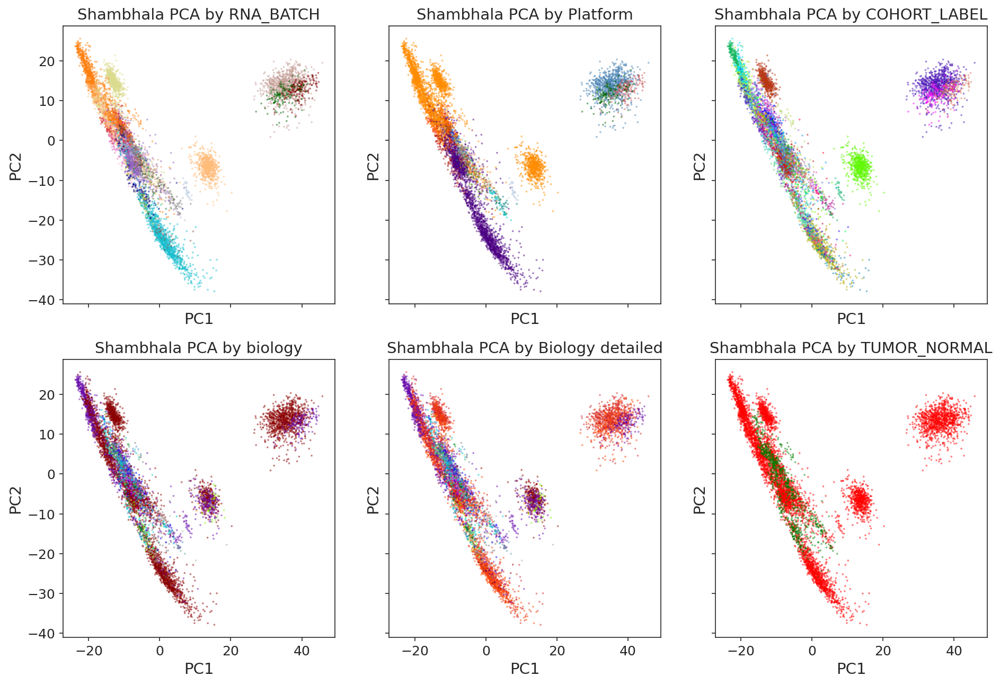

In [58]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True, squeeze=False)

pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL", xlabel = "PC1", ylabel = "PC2")


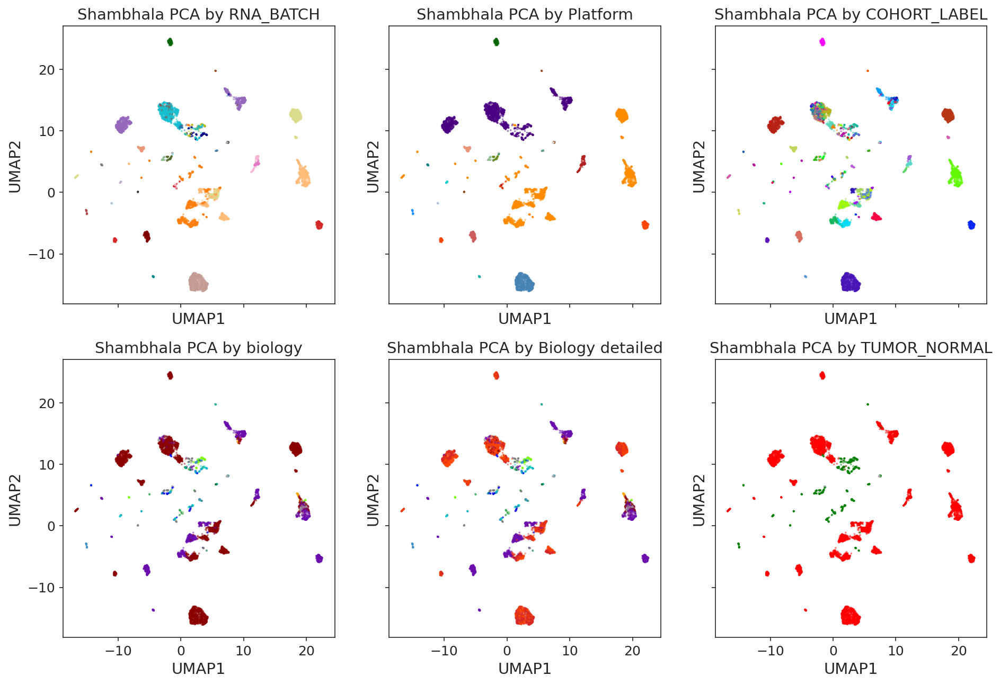

In [61]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
umap_plot(coords=umap_coords, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


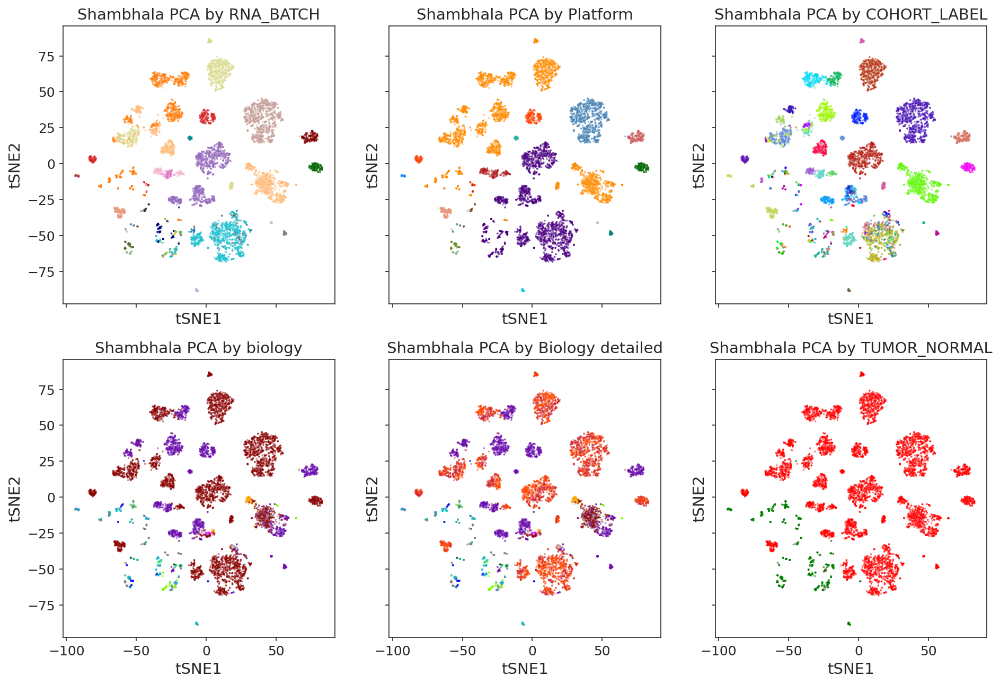

In [62]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
tsne_plot(coords=tsne_coords, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


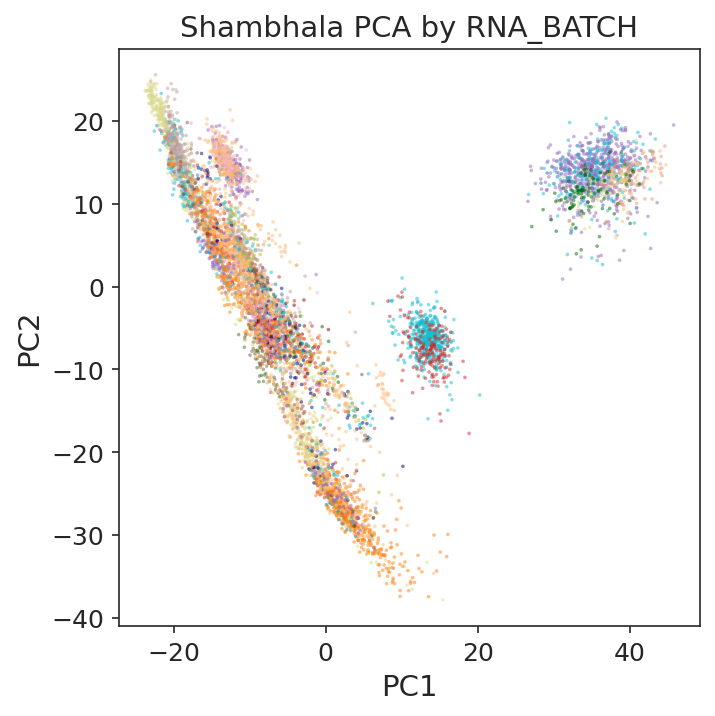

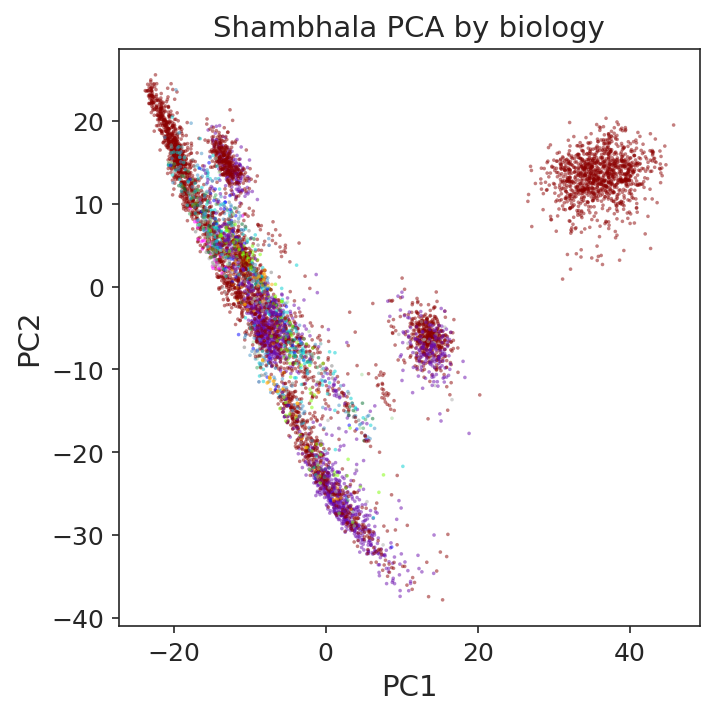

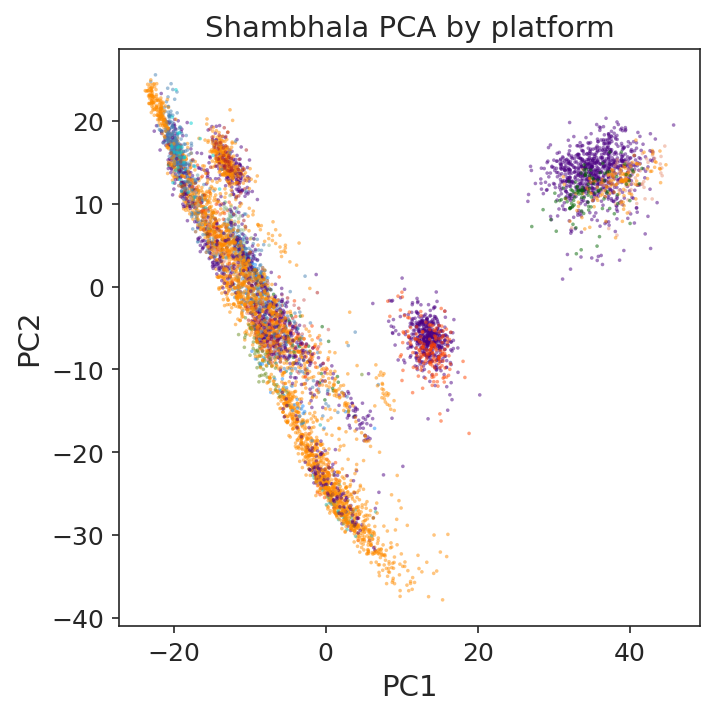

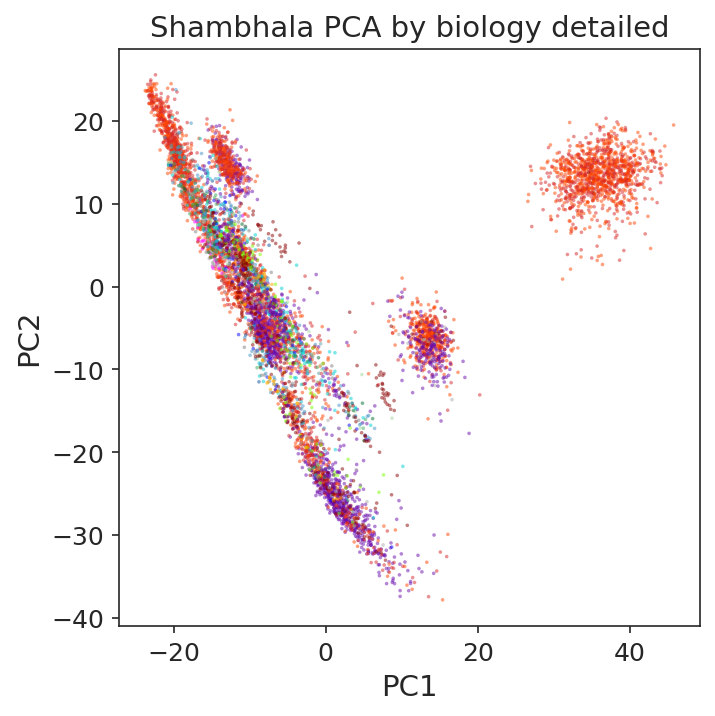

In [43]:



fig, ax = plt.subplots(figsize=(5, 5))
pca_plot(
    coords=pca_coords,
    ann_df=comb_ann,
    color_col = 'RNA_BATCH',
    palette=rna_batch_palette,
    ax=ax,
    title = "Shambhala PCA by RNA_BATCH",
    xlabel = "PC1",
    ylabel = "PC2",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
pca_plot(
    coords=pca_coords,
    ann_df=comb_ann,
    color_col = 'Diagnosis_cell_type_unified',  
    palette=lymphoma_ontogeny_palette,
    ax=ax,
    title = "Shambhala PCA by biology",
    xlabel = "PC1",
    ylabel = "PC2",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
pca_plot(
    coords=pca_coords,
    ann_df=comb_ann,
    color_col = 'PLATFORM_RNA',  
    palette=platform_palette,
    ax=ax,
    title = "Shambhala PCA by platform",
    xlabel = "PC1",
    ylabel = "PC2",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
pca_plot(
    coords=pca_coords,
    ann_df=comb_ann,
    color_col = 'Diagnosis_unified_with_coo',  
    palette=lymphoma_ontogeny_palette_detailed,
    ax=ax,
    title = "Shambhala PCA by biology detailed",
    xlabel = "PC1",
    ylabel = "PC2",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

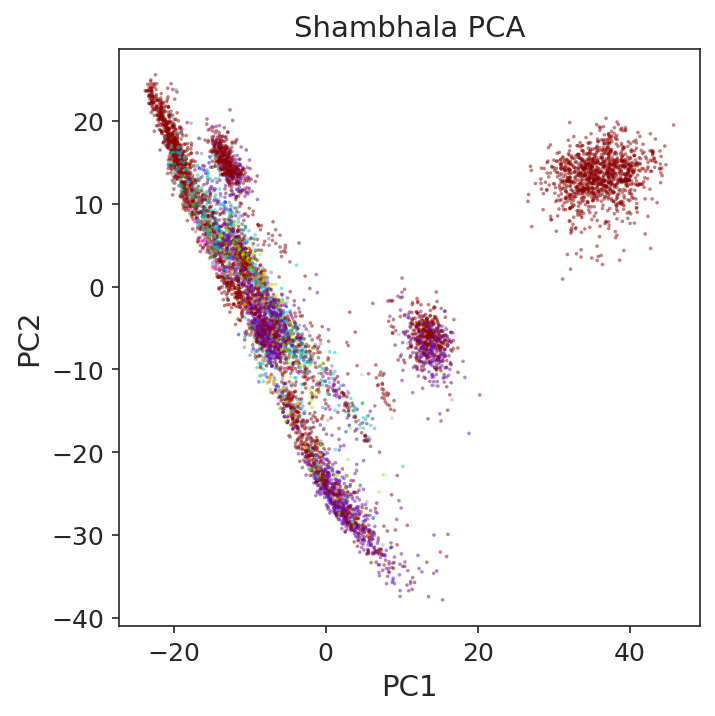

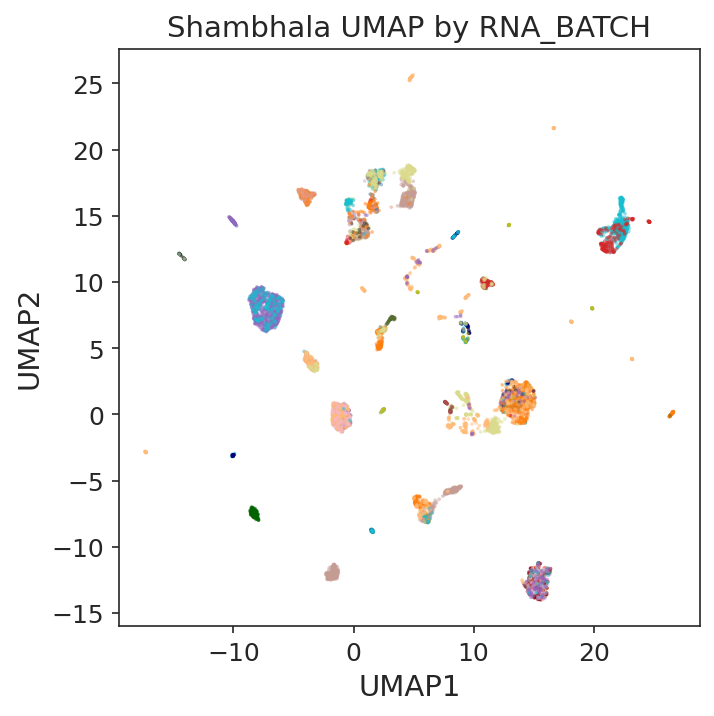

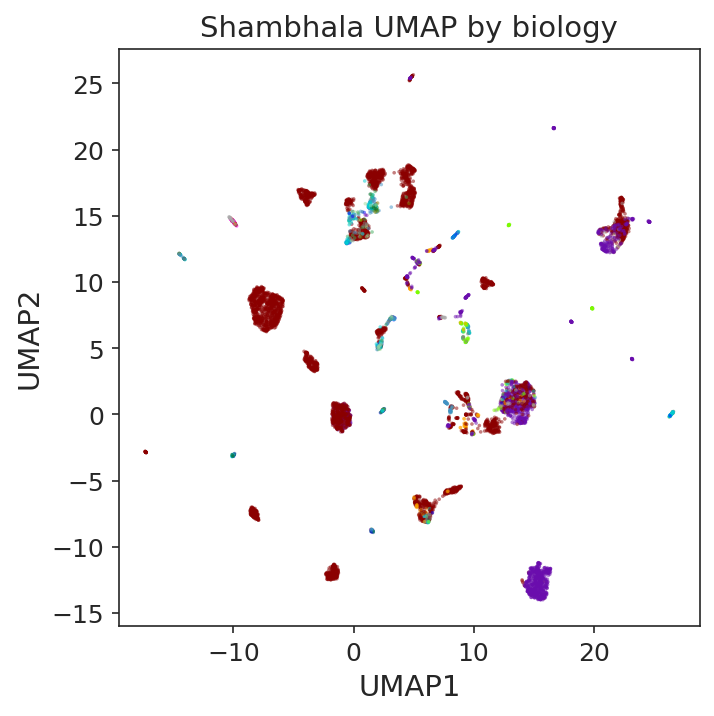

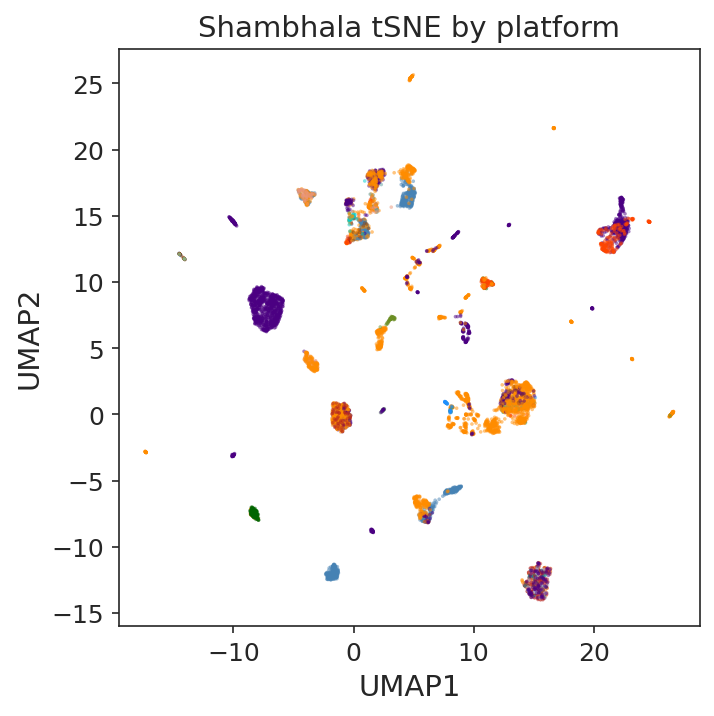

In [40]:
fig, ax = plt.subplots(figsize=(5, 5))
umap_plot(
    coords=umap_coords,
    ann_df=comb_ann,
    color_col = 'RNA_BATCH',
    palette=rna_batch_palette,
    ax=ax,
    title = "Shambhala UMAP by RNA_BATCH",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
umap_plot(
    coords=umap_coords,
    ann_df=comb_ann,
    color_col = 'Diagnosis_cell_type_unified',  
    palette=lymphoma_ontogeny_palette,
    ax=ax,
    title = "Shambhala UMAP by biology",

    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
umap_plot(
    coords=umap_coords,
    ann_df=comb_ann,
    color_col = 'PLATFORM_RNA',  
    palette=platform_palette,
    ax=ax,
    title = "Shambhala tSNE by platform",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

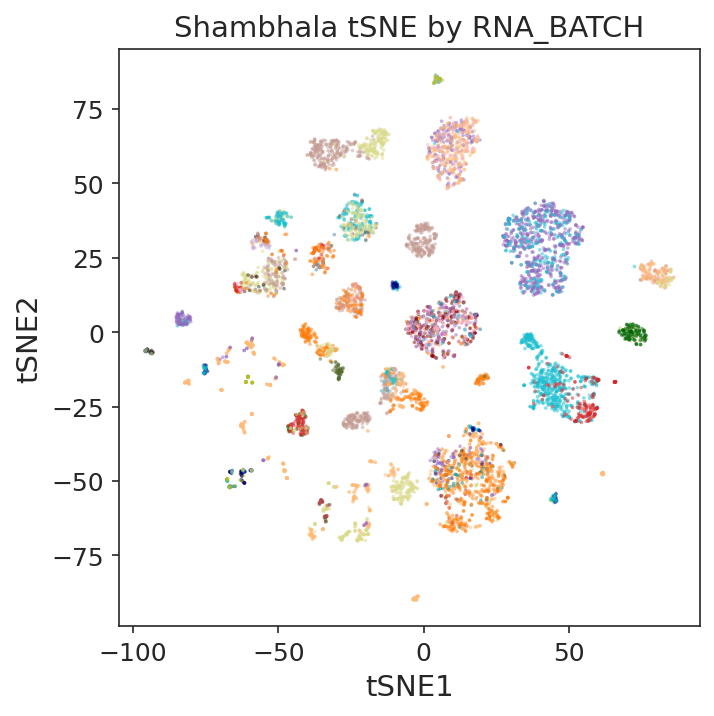

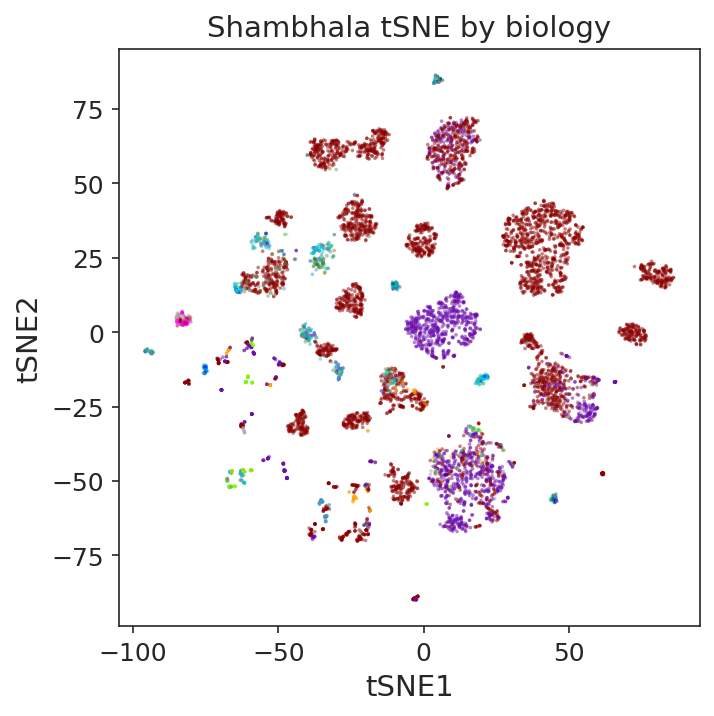

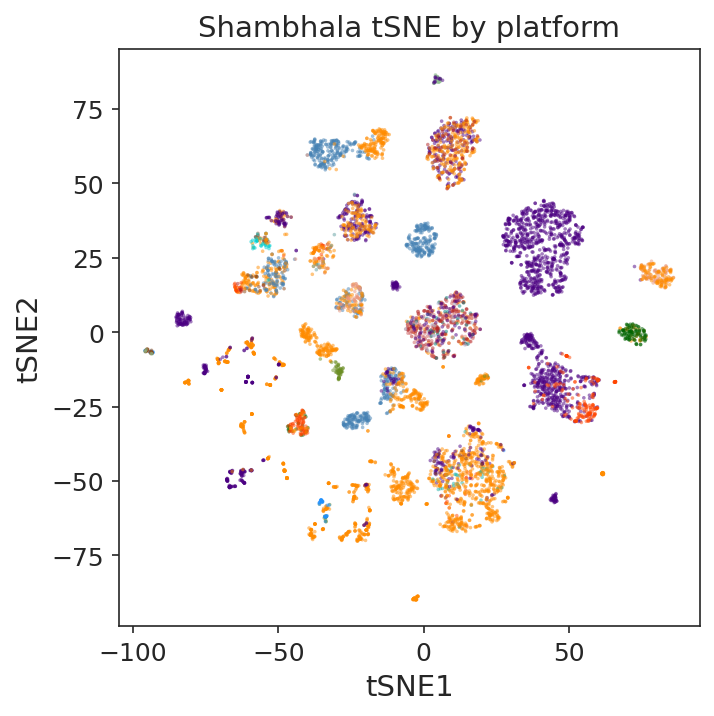

In [38]:
fig, ax = plt.subplots(figsize=(5, 5))
tsne_plot(
    coords=tsne_coords,
    ann_df=comb_ann,
    color_col = 'RNA_BATCH',
    palette=rna_batch_palette,
    ax=ax,
    title = "Shambhala tSNE by RNA_BATCH",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
tsne_plot(
    coords=tsne_coords,
    ann_df=comb_ann,
    color_col = 'Diagnosis_cell_type_unified',  
    palette=lymphoma_ontogeny_palette,
    ax=ax,
    title = "Shambhala tSNE by biology",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

fig, ax = plt.subplots(figsize=(5, 5))
tsne_plot(
    coords=tsne_coords,
    ann_df=comb_ann,
    color_col = 'PLATFORM_RNA',  
    palette=platform_palette,
    ax=ax,
    title = "Shambhala tSNE by platform",
    s = 3,
    alpha = 0.5,
    prefix_match = False,
    rasterized = True
)

## Distributions plotting

In [21]:
shambhala_harmonized

SYMBOL,A2M,AASDHPPT,AASS,ABAT,ABR,ABT1,ACAA1,ACACB,ACAT1,ACAT2,...,ZNF35,ZNF354A,ZNF43,ZNF45,ZNF74,ZNF76,ZNF83,ZNF85,ZNF91,ZYX
GSM3302930.PUB_DLBCL_GSE117556,14467.060656,991.017857,499.603202,1401.819341,8692.972740,683.833220,2503.832843,3099.990061,2587.370867,547.190915,...,227.706298,428.143385,310.146667,386.016601,444.773307,2262.483275,2320.797737,89.384559,489.455234,9470.378622
GSM3302931.PUB_DLBCL_GSE117556,15493.145853,1008.988599,510.809983,1844.448976,9545.242194,677.850592,2606.232562,3595.705385,2563.211877,529.358533,...,230.354052,425.054274,301.141747,383.905722,425.422036,2199.226794,2693.582368,94.198114,508.900485,9594.054504
GSM3302932.PUB_DLBCL_GSE117556,17747.533286,1081.036562,512.314046,1826.714013,8726.372494,680.182655,2603.293707,3594.493884,2545.594435,515.745937,...,229.076570,423.587921,322.948432,397.014542,412.674253,2205.598691,2589.005545,106.265612,556.232420,8642.404585
GSM3302933.PUB_DLBCL_GSE117556,15438.598185,1268.785028,511.297183,1909.061178,7385.522118,669.966791,2658.565306,3864.931923,2469.511541,519.599602,...,226.235331,425.039322,318.383419,391.477335,462.088037,2089.965371,3053.686427,103.357728,616.674424,10660.776896
GSM3302934.PUB_DLBCL_GSE117556,22907.636635,1212.688835,517.546556,1212.073472,8134.395238,676.219985,2617.689118,3364.854482,2540.297626,524.695301,...,226.694394,422.213947,312.649892,380.877937,418.243443,2093.665055,2424.671244,98.927977,524.450014,9544.754129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,8940.166504,1261.084259,549.793544,1788.288951,9337.867262,821.800724,2636.892361,1556.220460,2123.065761,450.840122,...,222.070779,522.615345,354.582592,403.163991,428.049824,2278.801585,3353.598490,102.737032,597.765693,12404.136381
GSM1517171,8983.870191,1192.750694,484.052199,1530.957550,7650.123835,730.446876,2339.413052,1379.056049,2071.259774,666.981611,...,220.989591,538.924262,364.416150,373.392881,420.720804,2132.885266,2455.188657,113.345456,678.633425,9120.850544
GSM1517172,9050.211991,1288.978592,484.120279,1971.106000,8475.414828,813.538335,2494.343366,1471.682750,2353.771310,669.481326,...,217.314938,482.403065,343.352300,378.932427,420.468746,2139.336193,2882.009639,110.869142,680.177241,10203.432886
GSM1517173,10348.091906,1214.779022,501.864284,1247.395796,7364.946429,813.761798,2278.704274,1282.676454,2491.616231,749.444242,...,224.072628,539.405767,371.342338,373.485549,409.574571,2125.365465,1806.355194,107.377020,658.133786,10212.802660


/home/jovyan/venvs/collagen_3_11/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


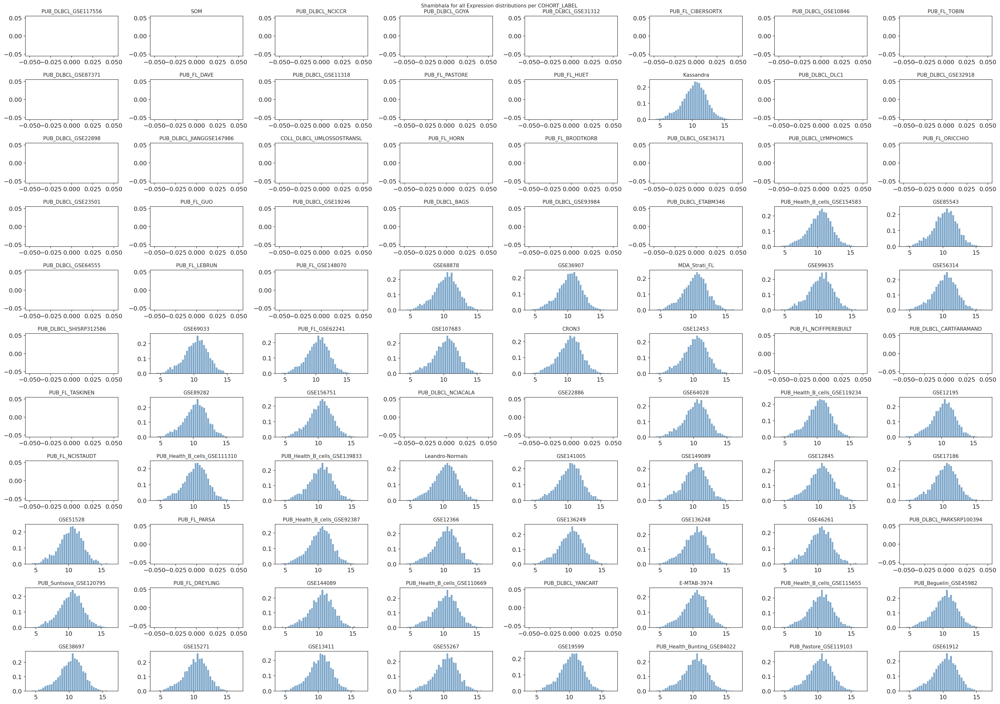

In [23]:
# ── 2c. Per-batch expression distribution check (Strategy A) ─────────────────

shambhala_harmonized_log = log_transform_by_cohort(shambhala_harmonized, comb_ann)
plot_batch_distributions(shambhala_harmonized_log, comb_ann, batch_col='COHORT_LABEL', title_prefix="Shambhala for all",
                        figsize=(28, 20))
plt.show()

Index(['GSM3302930_PUB_DLBCL_GSE117556', 'GSM3302931_PUB_DLBCL_GSE117556',
       'GSM3302932_PUB_DLBCL_GSE117556', 'GSM3302933_PUB_DLBCL_GSE117556',
       'GSM3302934_PUB_DLBCL_GSE117556', 'GSM3302935_PUB_DLBCL_GSE117556',
       'GSM3302936_PUB_DLBCL_GSE117556', 'GSM3302938_PUB_DLBCL_GSE117556',
       'GSM3302940_PUB_DLBCL_GSE117556', 'GSM3302942_PUB_DLBCL_GSE117556',
       ...
       'SRR3743471', 'SRR3743468', 'SRR7759712', 'SRR7759736', 'SRR7759713',
       'SRR7759737', 'GSM1517171', 'GSM1517172', 'GSM1517173', 'GSM1517174'],
      dtype='object', length=7237)

In [22]:
comb_ann.reindex(shambhala_1.columns)

,Diagnosis_cell_type_unified,Unnamed: 0.1,PLATFORM_RNA,OS,RNASEQ_PAIRED/SINGLE,DNA_REFERENCE_GENOME,PUBLIC_PATIENT_ID,NEO_CHEMO_THERAPY,NEO_THERAPY,RNASEQ_CALC_BY_BG,...,PFS (MONTHS),PD/DEAD,POD24,LAST FOLLOW-UP/DEATH DATE,OS (MONTHS),DEAD,COD,Notes,Diagnosis_with_coo,Diagnosis_unified_with_coo
GSM3302930.PUB_DLBCL_GSE117556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM3302931.PUB_DLBCL_GSE117556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM3302932.PUB_DLBCL_GSE117556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM3302933.PUB_DLBCL_GSE117556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM3302934.PUB_DLBCL_GSE117556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FL_1097.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1098.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1099.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1102.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
comb_ann.reindex(shambhala_2.columns)

,Diagnosis_cell_type_unified,Unnamed: 0.1,PLATFORM_RNA,OS,RNASEQ_PAIRED/SINGLE,DNA_REFERENCE_GENOME,PUBLIC_PATIENT_ID,NEO_CHEMO_THERAPY,NEO_THERAPY,RNASEQ_CALC_BY_BG,...,PFS (MONTHS),PD/DEAD,POD24,LAST FOLLOW-UP/DEATH DATE,OS (MONTHS),DEAD,COD,Notes,Diagnosis_with_coo,Diagnosis_unified_with_coo
FL_1106.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1107.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1183.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1184.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL_1185.PUB_FL_DAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,Naive,6404.0,RNASeq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BG_BAGS_,Naive_
GSM1517171,Bone_marrow_CD19+,6041.0,GPL10739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BG_BAGS_,Bone_marrow_CD19+_
GSM1517172,Bone_marrow_CD19+,6042.0,GPL10739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BG_BAGS_,Bone_marrow_CD19+_
GSM1517173,Bone_marrow_CD19+,6043.0,GPL10739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BG_BAGS_,Bone_marrow_CD19+_


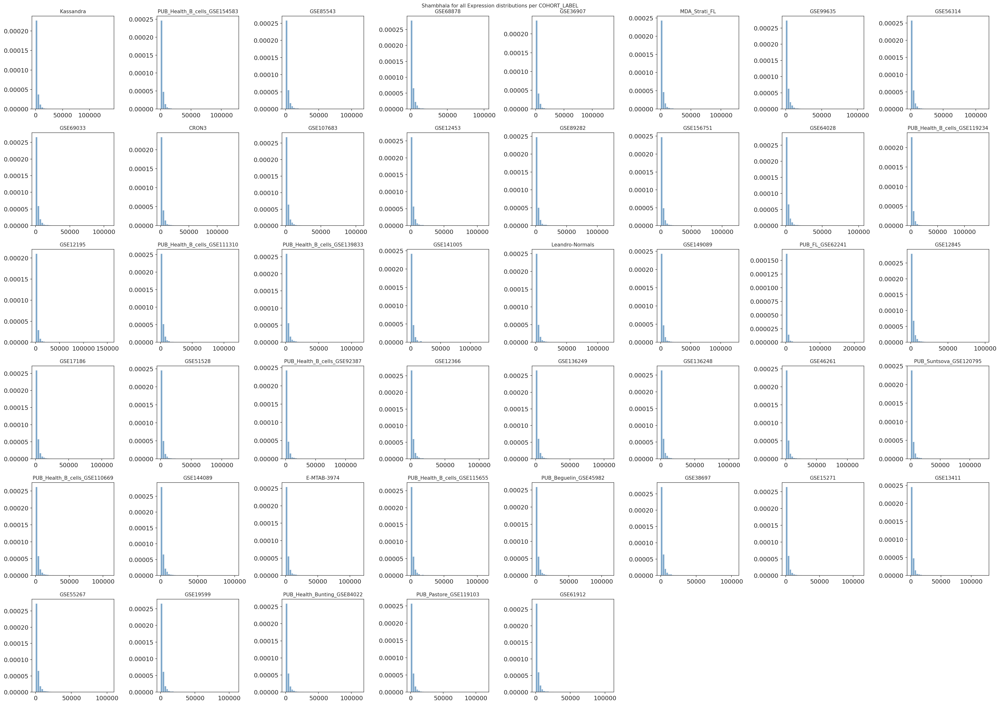

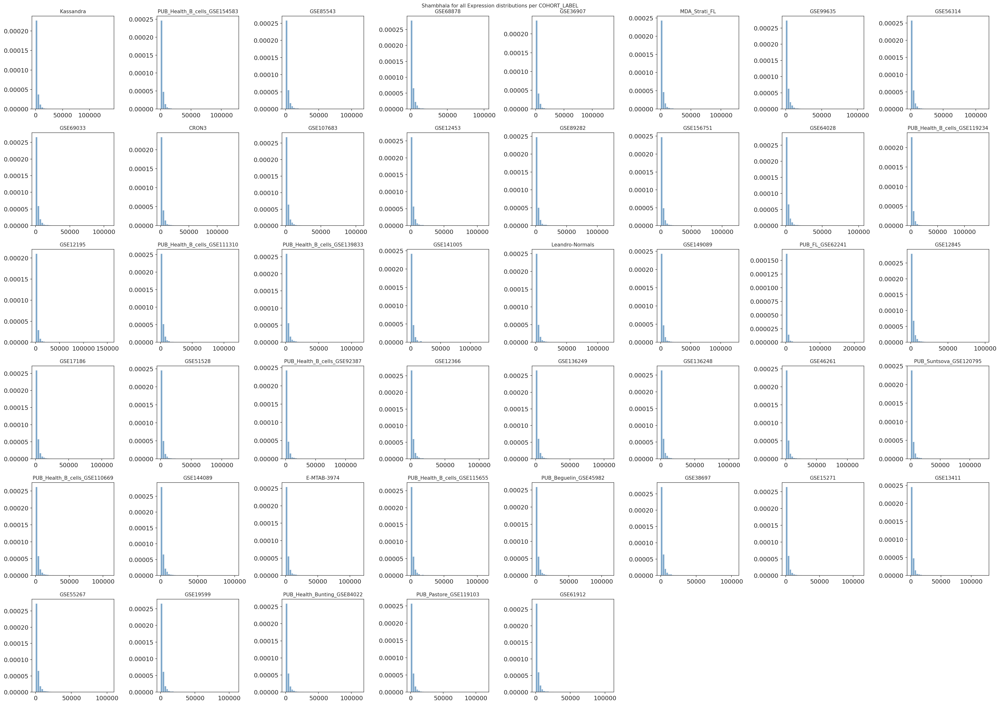

In [23]:
plot_batch_distributions(shambhala_2.T, comb_ann.reindex(shambhala_2.columns), batch_col='COHORT_LABEL', title_prefix="Shambhala for all",
                        figsize=(28, 20))


# Analyze speeded-up and the original Shambhala harmonization for strict S0 P0, Q0 pair of datasets

Speed-up s3://your-bucket/FL_batch_correction/exp/S0_no_removal__strict__shambhala_P0std_Q0std_speed_up__post0.tsv.gz

Original s3://your-bucket/FL_batch_correction/exp/S0_no_removal__strict__shambhala_P0std_Q0std__post0.tsv.gz

## Files read

In [4]:
s3 = boto3.client("s3")
body = s3.get_object(Bucket='your-bucket', Key='FL_batch_correction/exp/S0_no_removal__strict__shambhala_P0std_Q0std_speed_up__post0.tsv.gz')["Body"].read()

speed_shambhala = pd.read_csv(io.BytesIO(body), sep=",", index_col=0)
speed_shambhala


,A2M,AASDHPPT,AASS,ABAT,ABR,ABT1,ACAA1,ACACB,ACAT1,ACAT2,...,ZNF35,ZNF354A,ZNF43,ZNF45,ZNF74,ZNF76,ZNF83,ZNF85,ZNF91,ZYX
GSM3302930-PUB_DLBCL_GSE117556,15954.543092,979.507928,472.279506,1381.146282,7899.241810,661.213765,2511.839276,3262.715762,2590.310391,544.279370,...,222.800806,411.709627,307.772167,377.476884,424.086229,2167.376548,2301.638727,86.553059,497.617436,9318.104120
GSM3302931-PUB_DLBCL_GSE117556,15519.053129,1003.578306,491.394577,1808.374977,8838.269973,654.202007,2608.297663,3844.854092,2567.408593,524.823889,...,224.777889,407.923912,291.860206,371.968930,416.498916,2126.243267,2663.156685,87.888605,516.938705,9484.608571
GSM3302932-PUB_DLBCL_GSE117556,19207.103028,1072.934460,503.364812,1791.881254,8467.959327,659.352123,2601.650009,3834.432107,2543.835651,510.579824,...,225.634771,409.332747,313.857165,385.821621,410.644655,2169.744947,2555.694558,91.617569,559.563162,8510.436778
GSM3302933-PUB_DLBCL_GSE117556,17958.228376,1262.412545,526.609462,1872.264785,7411.676494,652.590678,2647.515690,3946.187923,2442.466864,516.457983,...,226.598782,406.804981,296.715602,374.278615,426.242372,2014.339104,3064.499359,90.298818,612.590486,10698.279808
GSM3302934-PUB_DLBCL_GSE117556,23574.534458,1205.921387,506.576358,1197.421012,8199.454192,652.323253,2610.624208,3604.863214,2527.281655,521.625845,...,223.805145,406.192491,291.374723,347.939129,415.171386,2004.474222,2409.407331,88.950790,525.558660,9462.310132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,8997.583684,1241.668728,512.523967,1727.498208,8017.932889,818.430873,2626.643736,1851.826087,2130.382064,435.269316,...,206.579201,512.849747,363.319660,398.694791,415.565318,2202.993622,3348.029139,89.622158,598.387968,12370.413264
SRR3743469,8945.300786,1366.095925,500.616772,1257.687909,8196.266471,815.986399,2413.462215,1821.074152,2156.132680,422.913460,...,210.849912,517.608213,358.834669,399.225569,397.525059,2172.305690,3303.019782,90.219615,582.530748,11896.147946
SRR3743470,8826.577447,1337.496483,452.517109,1203.258434,9089.983685,815.598149,2556.931236,2069.191162,2475.978405,451.863925,...,211.355623,499.301176,351.705245,390.984027,392.811068,2159.998654,2844.408414,92.092335,582.413657,13052.764487
SRR3743471,9039.593753,1343.733381,465.683543,1093.260321,9413.379725,810.582794,2554.733664,2133.793100,2437.591751,453.864150,...,214.383204,486.911423,351.431302,394.162516,393.930202,2162.853209,2742.100009,90.126669,572.737605,13179.423210


In [5]:
comb_ann_shambhala = comb_ann.reindex(speed_shambhala.index)

In [6]:
s3 = boto3.client("s3")
body = s3.get_object(Bucket='your-bucket', Key='FL_batch_correction/exp/S0_no_removal__strict__shambhala_P0std_Q0std__post0.tsv.gz')["Body"].read()

original_shambhala = pd.read_csv(io.BytesIO(gzip.decompress(body)), sep="\t", index_col=0)
original_shambhala


,A2M,AASDHPPT,AASS,ABAT,ABR,ABT1,ACAA1,ACACB,ACAT1,ACAT2,...,ZNF35,ZNF354A,ZNF43,ZNF45,ZNF74,ZNF76,ZNF83,ZNF85,ZNF91,ZYX
GSM3302930-PUB_DLBCL_GSE117556,16764.848753,980.732280,472.934270,1386.805916,7824.897251,658.717672,2488.863256,3062.732028,2560.079285,544.523286,...,225.273999,409.622599,307.391241,377.102123,424.106879,2159.598894,2306.979041,86.562011,526.370963,9328.925607
GSM3302931-PUB_DLBCL_GSE117556,15963.175734,1004.720206,491.799672,1806.066010,8791.282992,652.902674,2593.212954,3578.923252,2535.360681,524.381808,...,226.696724,406.857337,292.071496,371.463635,416.584847,2122.462362,2661.513301,87.927600,539.122075,9470.932384
GSM3302932-PUB_DLBCL_GSE117556,20085.057559,1074.112923,503.163422,1788.171358,8398.376734,656.179910,2586.193164,3554.209275,2512.019280,510.109400,...,226.630780,406.775357,314.533463,385.135905,410.555818,2164.419869,2554.255675,91.835795,583.167668,8505.250704
GSM3302933-PUB_DLBCL_GSE117556,18755.434512,1262.602117,526.396753,1867.837961,7393.862264,649.441947,2634.862026,3870.882472,2412.896714,516.322201,...,229.129665,404.477824,296.869496,373.022488,426.469489,2007.586128,3058.350316,90.386312,618.370185,10662.401501
GSM3302934-PUB_DLBCL_GSE117556,24592.980404,1206.462902,506.511222,1201.251768,8146.039412,650.415177,2593.555553,3327.655513,2492.590436,521.107661,...,226.730387,404.687165,291.402120,347.262369,415.132127,2001.354920,2412.026560,89.063795,552.832103,9445.114663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,9061.481824,1244.657246,513.187012,1737.256630,7998.926912,815.547365,2606.666089,1416.887621,2062.275228,436.440291,...,204.976691,509.205181,370.227726,396.884496,415.767522,2199.822261,3351.056273,89.815473,622.477761,12386.127600
SRR3743469,8654.218576,1363.511691,501.812187,1264.796734,8224.693230,810.860512,2375.531106,1355.323074,2110.083936,426.448202,...,209.520857,514.677412,356.157191,397.640400,397.630006,2169.886596,3304.957256,90.343547,610.439771,11910.413088
SRR3743470,8831.024830,1340.521136,453.310061,1221.442182,9054.237717,810.077477,2534.264750,1491.453880,2430.094715,454.508073,...,209.686966,493.936143,358.024363,388.166076,392.933305,2147.647604,2853.178419,92.322757,585.170632,13070.642147
SRR3743471,9011.951053,1345.978757,466.432035,1102.651253,9342.880332,804.308852,2629.357313,1556.075284,2641.403396,454.630063,...,212.776771,480.997932,357.256395,391.322685,393.851281,2149.065430,2747.488307,90.271653,606.222743,13205.096275


## PCA, UMAP, TSNE

In [7]:
pca_coords_speed = compute_pca_coords(speed_shambhala)[0]
pca_coords_original = compute_pca_coords(original_shambhala)[0]
pca_coords_speed

NameError: name 'compute_pca_coords' is not defined

In [ ]:
umap_coords_speed = compute_umap_coords(speed_shambhala)
tsne_coords_speed = compute_tsne_coords(speed_shambhala)
umap_coords_original = compute_umap_coords(original_shambhala)
tsne_coords_original = compute_tsne_coords(original_shambhala)

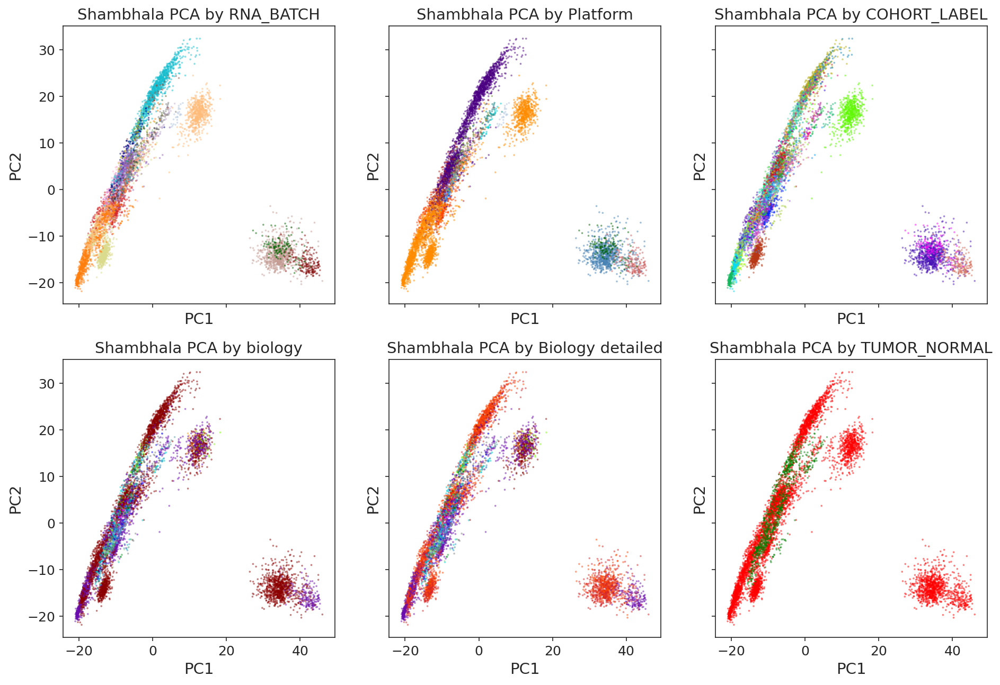

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True, squeeze=False)

pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_original, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL", xlabel = "PC1", ylabel = "PC2")


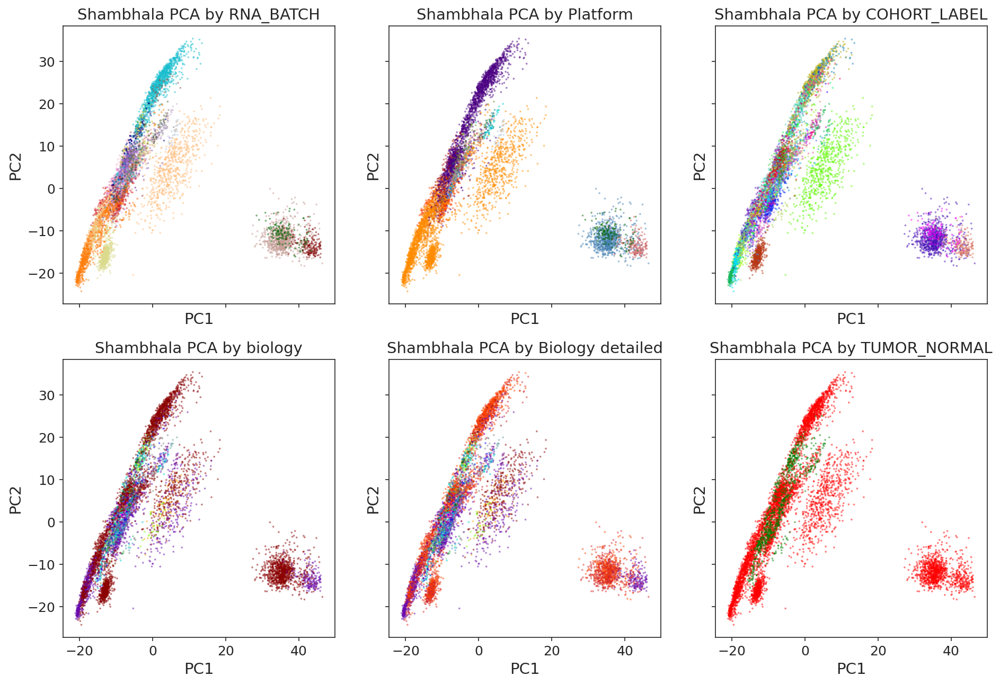

In [17]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True, squeeze=False)

pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL", xlabel = "PC1", ylabel = "PC2")
pca_plot(coords=pca_coords_speed, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL", xlabel = "PC1", ylabel = "PC2")


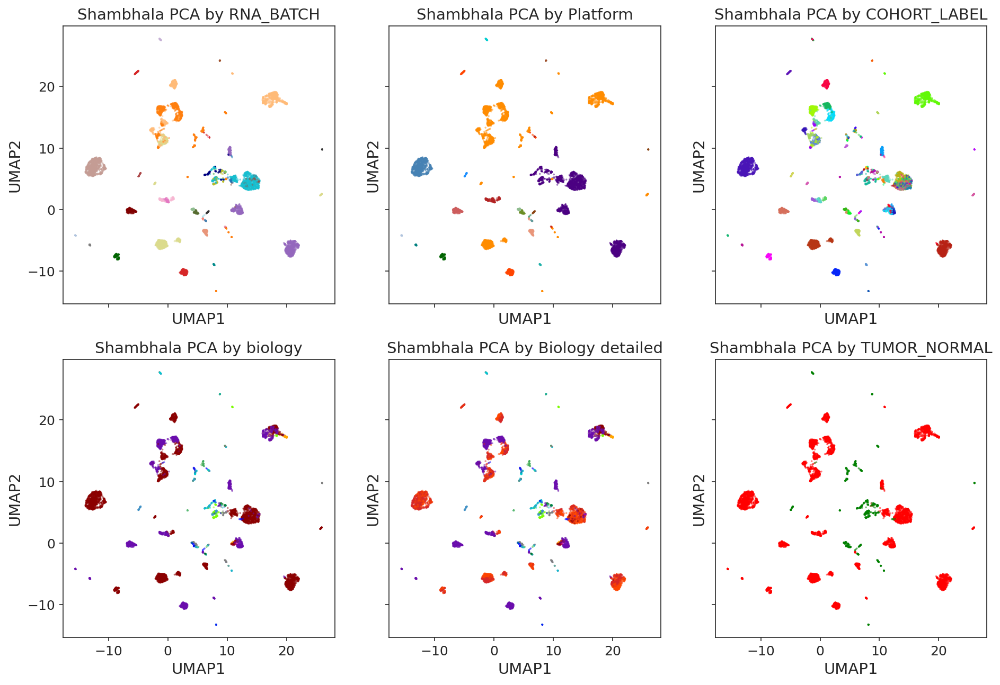

In [19]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
umap_plot(coords=umap_coords_original, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


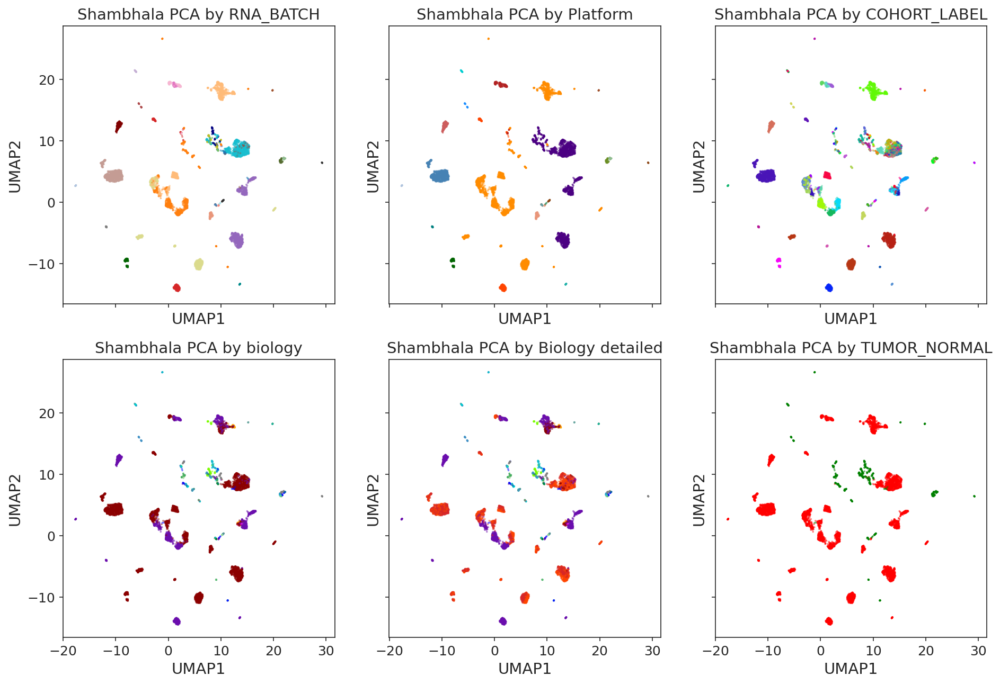

In [20]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
umap_plot(coords=umap_coords_speed, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


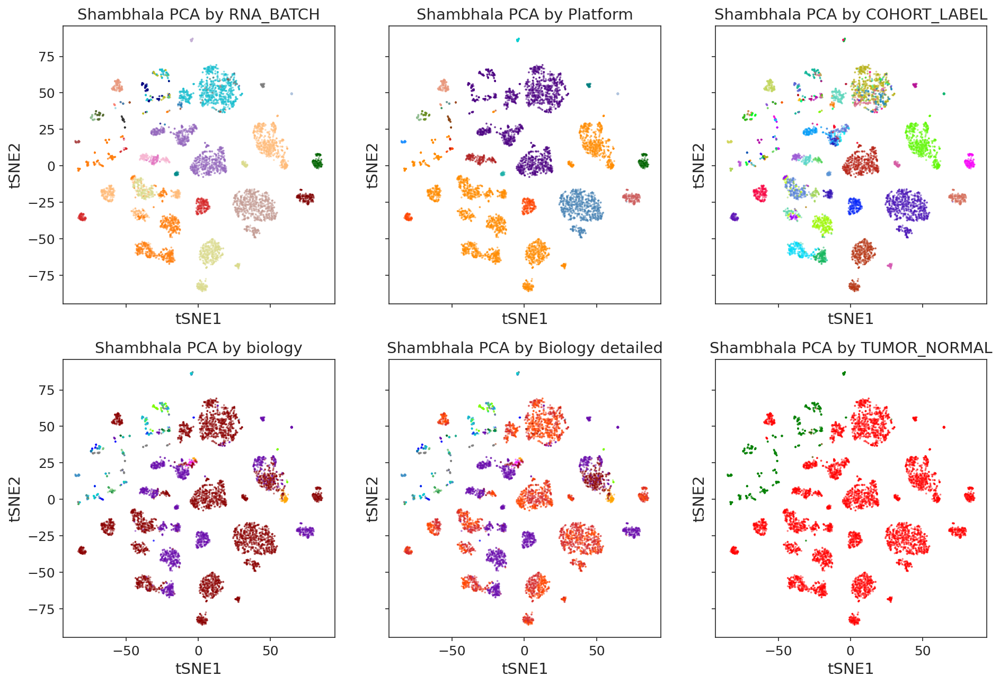

In [21]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
tsne_plot(coords=tsne_coords_original, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


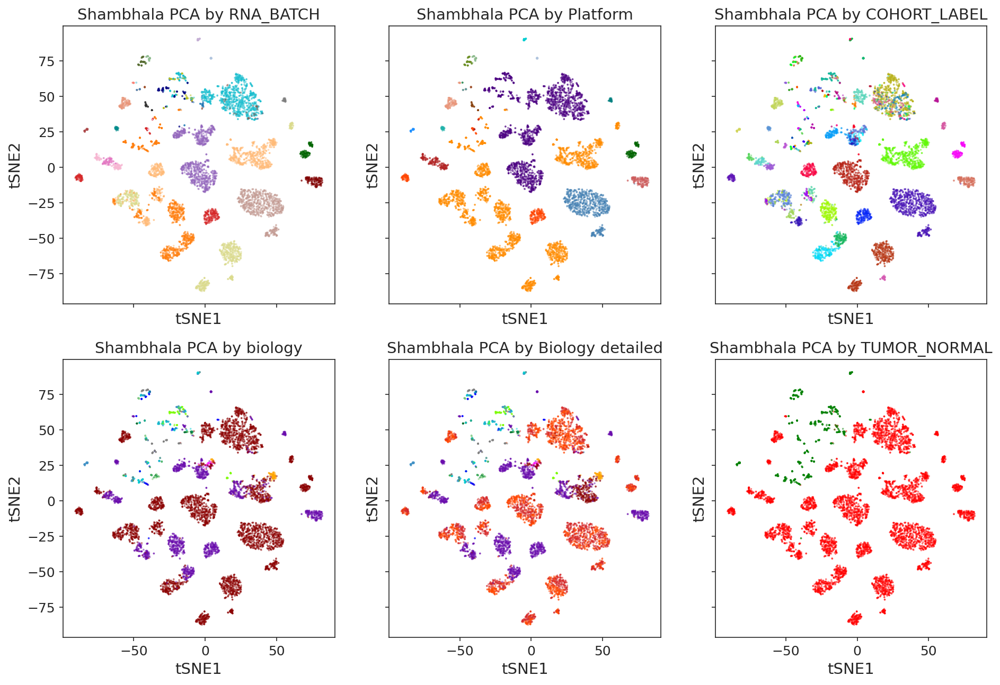

In [22]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    squeeze=False,
)

tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'RNA_BATCH', palette=rna_batch_palette, ax=axes[0, 0], title = "Shambhala PCA by RNA_BATCH")
tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_cell_type_unified', palette=lymphoma_ontogeny_palette, ax=axes[1, 0], title = "Shambhala PCA by biology")
tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'PLATFORM_RNA', palette=platform_palette, ax=axes[0, 1], title = "Shambhala PCA by Platform")
tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'Diagnosis_unified_with_coo', palette=lymphoma_ontogeny_palette_detailed, ax=axes[1, 1], title = "Shambhala PCA by Biology detailed")
tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'COHORT_LABEL', palette=cohort_palette, ax=axes[0, 2], title = "Shambhala PCA by COHORT_LABEL")
tsne_plot(coords=tsne_coords_speed, ann_df=comb_ann_shambhala, color_col = 'TUMOR_NORMAL', palette={'Tumor': 'red', 'Normal': 'green'}, ax=axes[1, 2], title = "Shambhala PCA by TUMOR_NORMAL")


## Mean relative difference and other metrics calculation

In [20]:
relative_difference

,A2M,AASDHPPT,AASS,ABAT,ABR,ABT1,ACAA1,ACACB,ACAT1,ACAT2,...,ZNF35,ZNF354A,ZNF43,ZNF45,ZNF74,ZNF76,ZNF83,ZNF85,ZNF91,ZYX
GSM3302930-PUB_DLBCL_GSE117556,0.048334,0.001248,0.001384,0.004081,0.009501,0.003789,0.009232,0.065296,0.011809,0.000448,...,0.010979,0.005095,0.001239,0.000994,0.000049,0.003601,0.002315,0.000103,0.054626,0.001160
GSM3302931-PUB_DLBCL_GSE117556,0.027822,0.001137,0.000824,0.001278,0.005345,0.001990,0.005817,0.074305,0.012640,0.000843,...,0.008464,0.002621,0.000723,0.001360,0.000206,0.001781,0.000617,0.000443,0.041147,0.001444
GSM3302932-PUB_DLBCL_GSE117556,0.043712,0.001097,0.000400,0.002075,0.008285,0.004834,0.005977,0.078843,0.012666,0.000922,...,0.004395,0.006287,0.002150,0.001780,0.000216,0.002460,0.000563,0.002376,0.040476,0.000610
GSM3302933-PUB_DLBCL_GSE117556,0.042505,0.000150,0.000404,0.002370,0.002409,0.004848,0.004802,0.019454,0.012255,0.000263,...,0.011046,0.005753,0.000518,0.003367,0.000533,0.003364,0.002011,0.000968,0.009347,0.003365
GSM3302934-PUB_DLBCL_GSE117556,0.041412,0.000449,0.000129,0.003189,0.006557,0.002934,0.006581,0.083304,0.013918,0.000994,...,0.012902,0.003720,0.000094,0.001949,0.000095,0.001559,0.001086,0.001269,0.049334,0.001821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR7759737,0.007052,0.002401,0.001292,0.005617,0.002376,0.003536,0.007664,0.306968,0.033025,0.002683,...,0.007818,0.007157,0.018659,0.004561,0.000486,0.001442,0.000903,0.002152,0.038700,0.001269
SRR3743469,0.033635,0.001895,0.002382,0.005621,0.003456,0.006322,0.015967,0.343646,0.021823,0.008289,...,0.006343,0.005694,0.007518,0.003986,0.000264,0.001115,0.000586,0.001372,0.045720,0.001198
SRR3743470,0.000504,0.002256,0.001749,0.014887,0.003948,0.006815,0.008944,0.387365,0.018881,0.005818,...,0.007958,0.010862,0.017650,0.007260,0.000311,0.005751,0.003074,0.002496,0.004711,0.001368
SRR3743471,0.003067,0.001668,0.001605,0.008517,0.007546,0.007800,0.028381,0.371266,0.077160,0.001685,...,0.007550,0.012294,0.016305,0.007257,0.000200,0.006416,0.001961,0.001606,0.055236,0.001944


In [18]:
relative_difference = (original_shambhala - speed_shambhala).abs() / original_shambhala

In [39]:
mean_rel_diff_cohort = relative_difference.merge(comb_ann_shambhala['COHORT_LABEL'], left_index=True, right_index=True).groupby('COHORT_LABEL').mean().mean(axis=1)
mean_rel_diff_cohort


COHORT_LABEL
COLL_DLBCL_UMLOSSOSTRANSL      0.010193
CRON3                          0.013228
E-MTAB-3974                    0.013783
GSE107683                      0.010730
GSE12195                       0.012500
                                 ...   
PUB_Health_B_cells_GSE92387    0.009952
PUB_Health_Bunting_GSE84022    0.014373
PUB_Pastore_GSE119103          0.012593
PUB_Suntsova_GSE120795         0.009857
SOM                            0.270330
Length: 88, dtype: float64

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86],
 [Text(0, 0, 'GSE136249'),
  Text(1, 0, 'PUB_Health_Bunting_GSE84022'),
  Text(2, 0, 'GSE12366'),
  Text(3, 0, 'Leandro-Normals'),
  Text(4, 0, 'GSE69033'),
  Text(5, 0, 'GSE149089'),
  Text(6, 0, 'E-MTAB-3974'),
  Text(7, 0, 'GSE19599'),
  Text(8, 0, 'PUB_Health_B_cells_GSE111310'),
  Text(9, 0, 'GSE12845'),
  Text(10, 0, 'CRON3'),
  Text(11, 0, 'PUB_DLBCL_ETABM346'),
  Text(12, 0, 'GSE22886'),
  Text(13, 0, 'PUB_FL_HORN'),
  Text(14, 0, 'GSE15271'),
  Text(15, 0, 'PUB_FL_ORICCHIO'

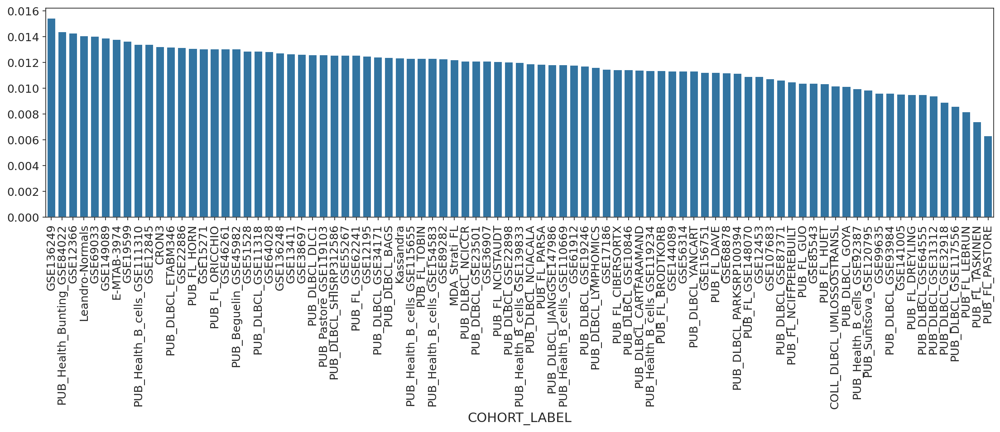

In [61]:

fig, ax = plt.subplots(figsize=(18,4))
sns.barplot(mean_rel_diff_cohort.sort_values()[::-1][1:])
plt.xticks(rotation=90)              

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86],
 [Text(0, 0, 'GSE136249'),
  Text(1, 0, 'PUB_Health_Bunting_GSE84022'),
  Text(2, 0, 'GSE12366'),
  Text(3, 0, 'Leandro-Normals'),
  Text(4, 0, 'GSE69033'),
  Text(5, 0, 'GSE149089'),
  Text(6, 0, 'E-MTAB-3974'),
  Text(7, 0, 'GSE19599'),
  Text(8, 0, 'PUB_Health_B_cells_GSE111310'),
  Text(9, 0, 'GSE12845'),
  Text(10, 0, 'CRON3'),
  Text(11, 0, 'PUB_DLBCL_ETABM346'),
  Text(12, 0, 'GSE22886'),
  Text(13, 0, 'PUB_FL_HORN'),
  Text(14, 0, 'GSE15271'),
  Text(15, 0, 'PUB_FL_ORICCHIO'

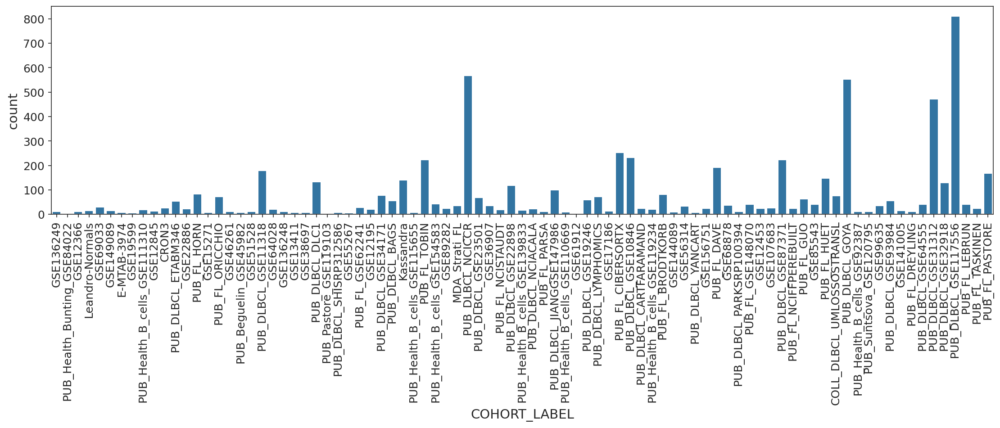

In [59]:
fig, ax = plt.subplots(figsize=(18,4))
sns.barplot(comb_ann_shambhala['COHORT_LABEL'].value_counts().reindex(mean_rel_diff_cohort.sort_values()[::-1][1:].index))
plt.xticks(rotation=90) 

In [63]:
original_shambhala.mean()

A2M         17753.998176
AASDHPPT     1298.717763
AASS          484.548027
ABAT         1536.365477
ABR          7946.811430
                ...     
ZNF76        2066.567716
ZNF83        2844.855501
ZNF85          92.094475
ZNF91         627.558488
ZYX         10554.240007
Length: 2293, dtype: float64

<Axes: xlabel='mean_expression', ylabel='mean_rel_gene_change'>

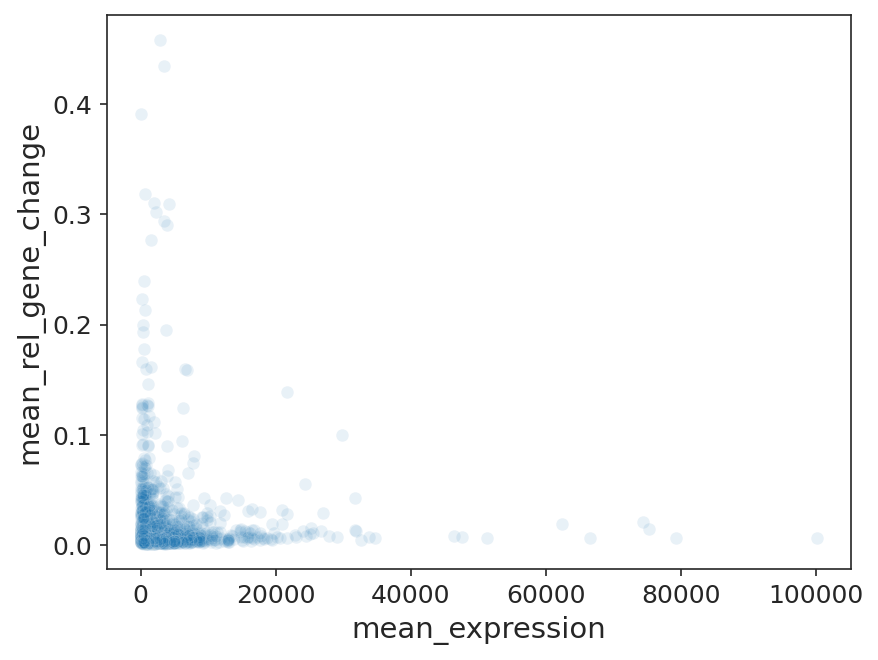

In [68]:
mean_rel_gene_change = relative_difference.merge(comb_ann_shambhala['COHORT_LABEL'], left_index=True, right_index=True).groupby('COHORT_LABEL').mean().mean()
data_to_plot = pd.concat([mean_rel_gene_change, original_shambhala.mean()], axis=1)
data_to_plot.columns = ['mean_rel_gene_change', 'mean_expression']
sns.scatterplot(data=data_to_plot, x='mean_expression', y='mean_rel_gene_change', alpha=0.1)



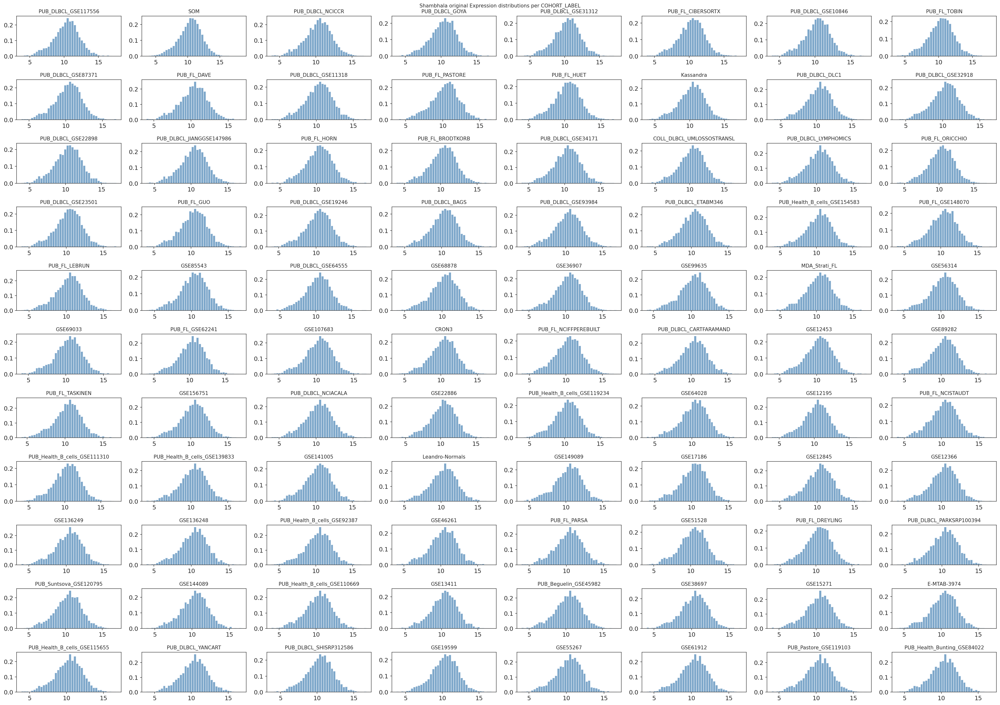

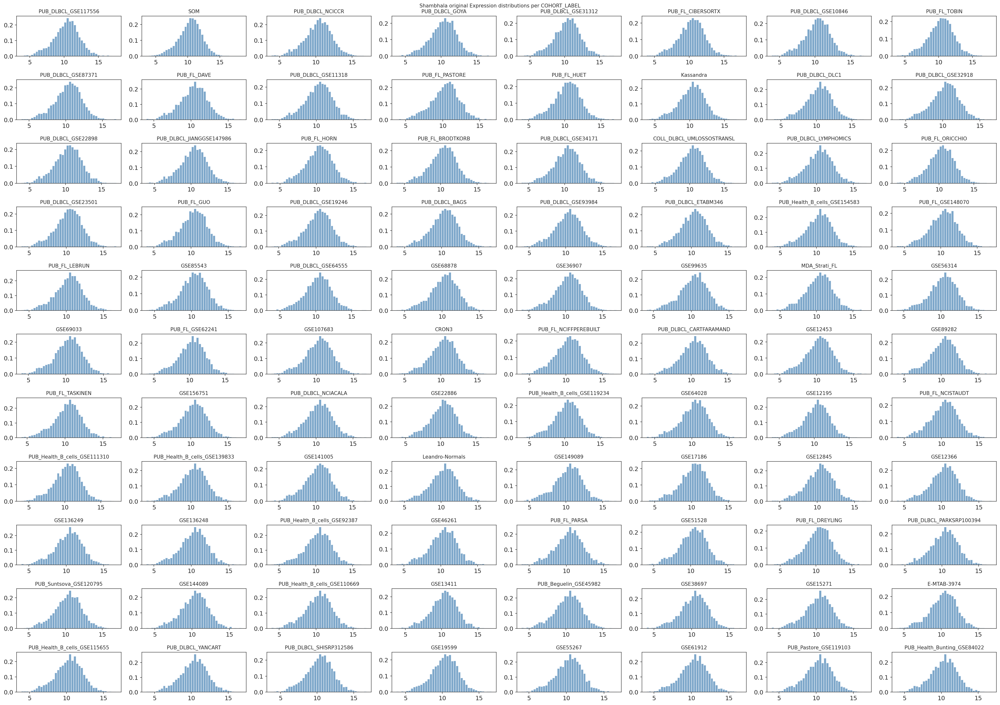

In [26]:
original_shambhala_log = log_transform_by_cohort(original_shambhala, comb_ann_shambhala)

plot_batch_distributions(original_shambhala_log, comb_ann_shambhala, batch_col='COHORT_LABEL', title_prefix="Shambhala original",
                        figsize=(28, 20))

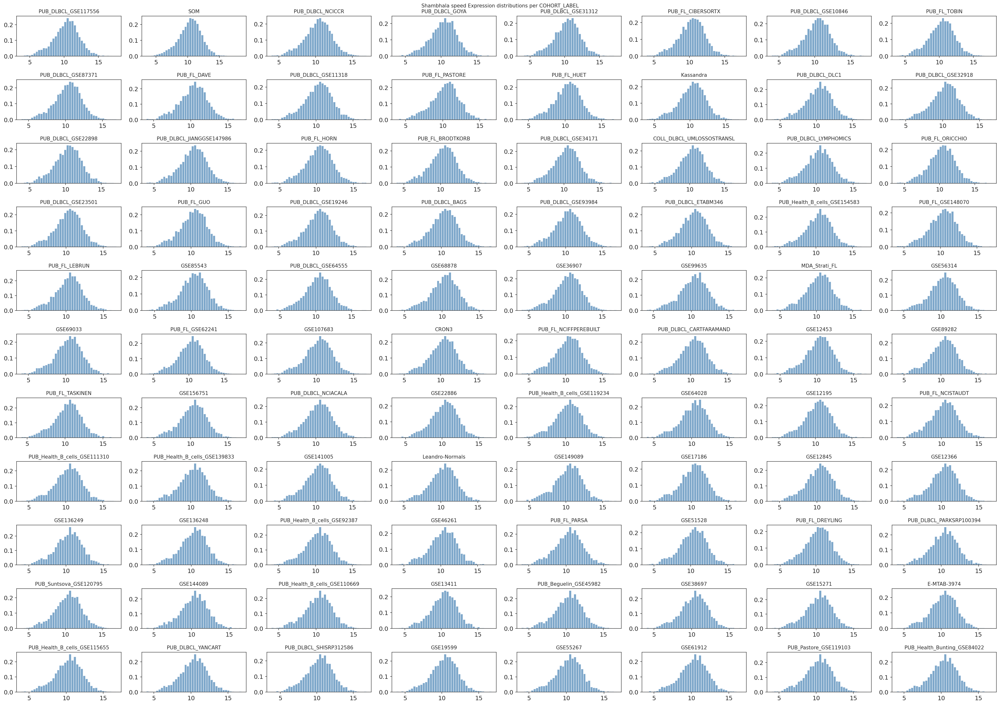

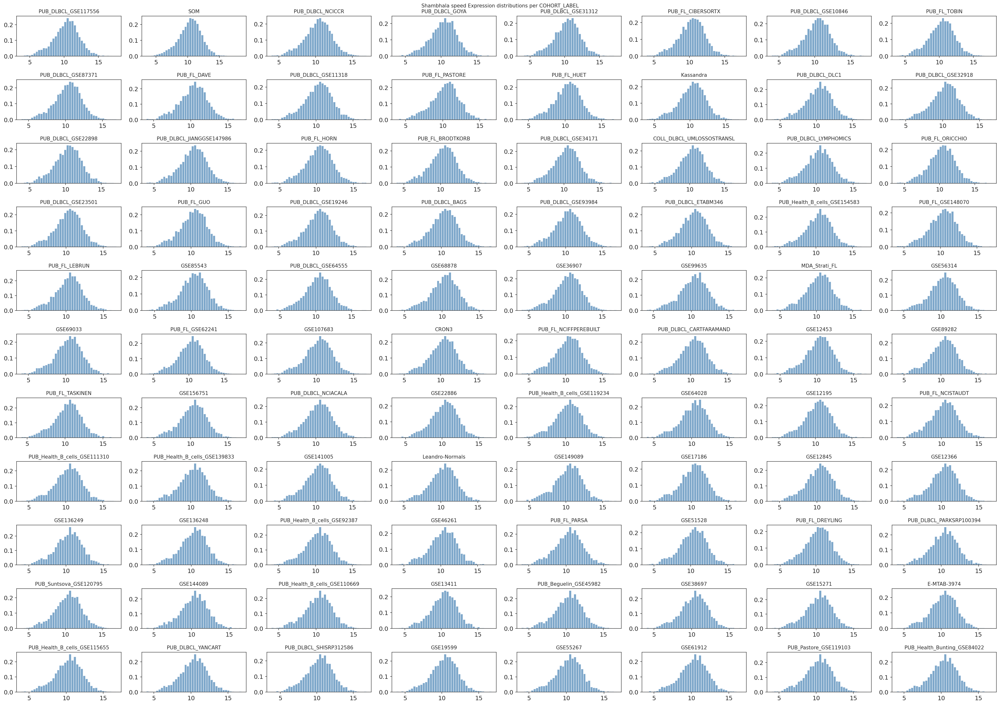

In [27]:
speed_shambhala_log = log_transform_by_cohort(speed_shambhala, comb_ann_shambhala)

plot_batch_distributions(speed_shambhala_log, comb_ann_shambhala, batch_col='COHORT_LABEL', title_prefix="Shambhala speed",
                        figsize=(28, 20))

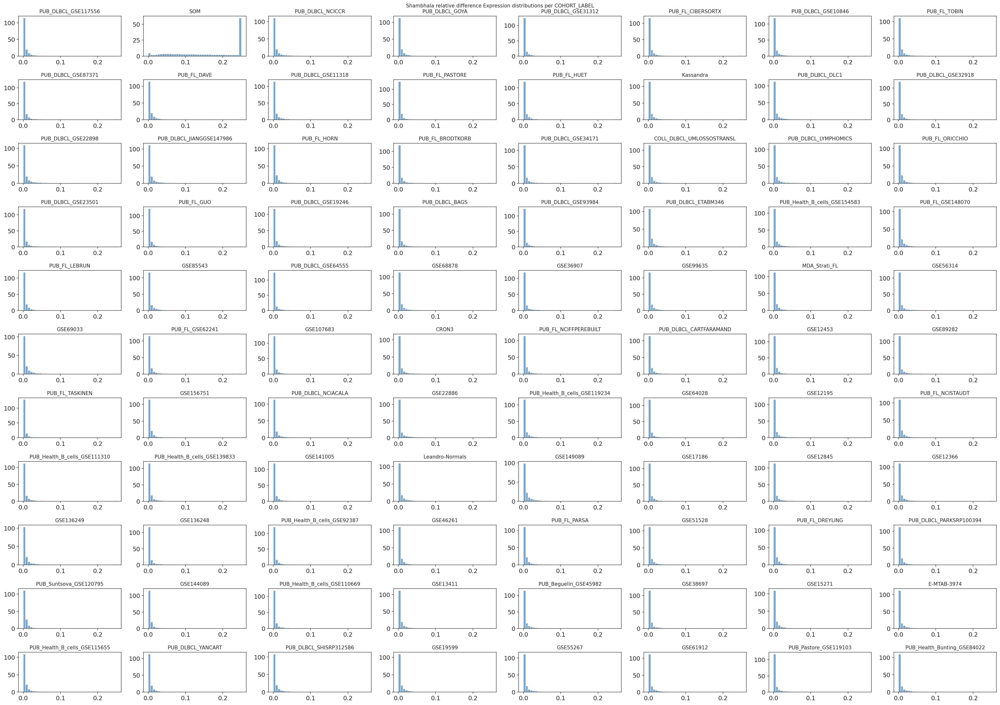

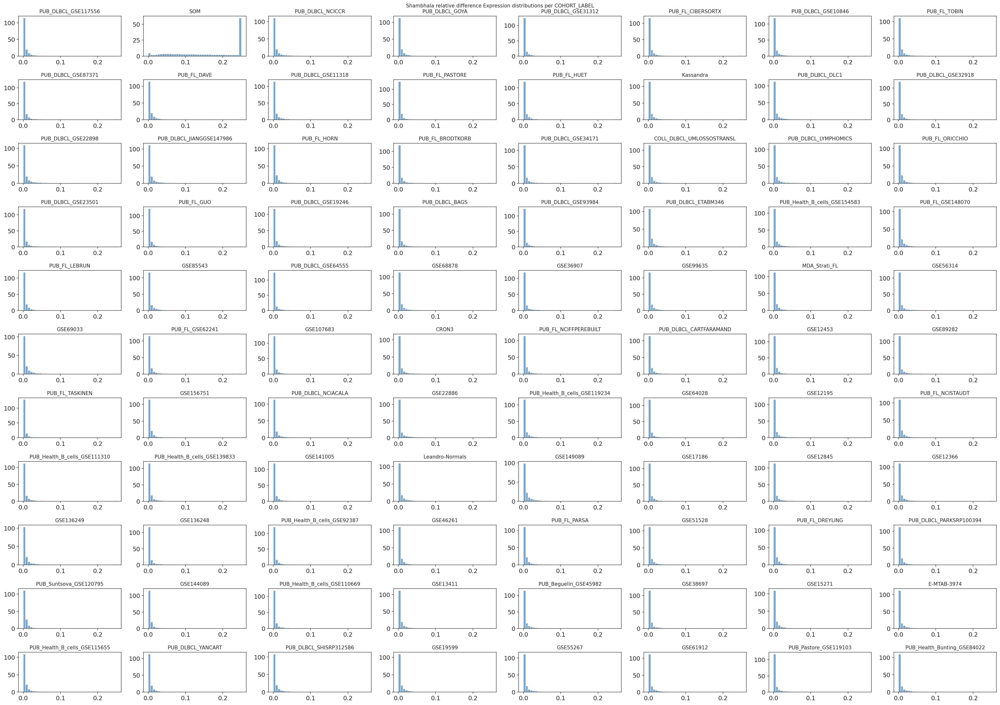

In [32]:
#relative_difference_log = log_transform_by_cohort(relative_difference, comb_ann_shambhala)

plot_batch_distributions(relative_difference.clip(0, 0.25),
                         comb_ann_shambhala, batch_col='COHORT_LABEL', title_prefix="Shambhala relative difference",
                        figsize=(28, 20))

In [ ]:
## Dependency of relative difference on the average expression